## Part 1: Wind Turbine Power Generation - Exploratory Data Analysis (EDA)

A comprehensive analysis of wind turbine dataset following industry best practices, including data exploration, visualization, and insights generation suitable for both technical and non-technical stakeholders.

[Data source](https://www.kaggle.com/datasets/sudhanvahg/wind-turbine-power-generation-forecasting/)

### 1.1 Setup and Data Loading

#### If using Conda

Setting up project environment

In [1]:
# From project root directory
# conda create -n proj_windTurb python=3.11  #Location: C:\Users\<user_name>\anaconda3\envs\proj_windTurb 
# conda activate proj_windTurb

# Install required packages manually
# conda install pandas numpy matplotlib seaborn scikit-learn statsmodels

# Install Jupyter support so that the environment can be used as a kernel in Jupyter notebooks
# conda install jupyterlab
# conda install ipykernel
# python -m ipykernel install --user --name=proj_windTurb --display-name "Python (proj_windTurb)"

# Export to environment.yml
# conda env export --from-history > environment.yml OR
# conda env export --from-history --name proj_windTurb > environment.yml OR
# conda env export --name proj_windTurb > environment.yml

# Add to .gitignore
# echo "environment.yml" >> .gitignore
# echo "proj_windTurb" >> .gitignore
# echo "*.conda" >> .gitignore
# echo "*.env" >> .gitignore


# Ignore conda environments,  python cache files and data
# echo "*.pyc" >> .gitignore
# echo "__pycache__" >> .gitignore
# echo ".ipynb_checkpoints" >> .gitignore
# echo ".env" >> .gitignore
# echo "proj_windTurb/" >> .gitignore
# echo ".conda" >> .gitignore
# echo ".DS_Store" >> .gitignore
# echo ".vscode/" >> .gitignore
# echo "data/" >> .gitignore # Remove this line if you want to track data files


# Install required packages from environment.yml
# conda env create -f environment.yml
# conda activate proj_windTurb

#### If using venv + pip

Setting up project environment

In [2]:
# From project root directory
# python -m venv proj_windTurb

# Activate the virtual environment
# For Windows, use the following command:
# proj_windTurb\Scripts\activate
# For macOS/Linux, use the following command:
# source proj_windTurb/bin/activate

# Install the required packages manually
# pip install pandas numpy matplotlib seaborn scikit-learn statsmodels

# Generate requirements.txt
# pip freeze > requirements.txt 
# Add to .gitignore
# echo "proj_windTurb/" >> .gitignore

# Install the required packages from requirements.txt
# python -m venv proj_windTurb
# source proj_windTurb/bin/activate  # For macOS/Linux
# pip install -r requirements.txt

#### Initial setup with git

Create a file .gitignore in the root directory. (Remove data/ from .gitignore if the data is not confidential or too large and should be committed)

In [3]:
# Ignore Conda environments, Python cache files, and data
# *.pyc
# __pycache__/
# .ipynb_checkpoints/
# .env/
# venv/
# env/
# *.conda
# *.egg-info
# .DS_Store
# data/
# old/ # Previous versions of files


#### Loading libraries

Importing necessary libraries for EDA

In [1]:
# Import necessary preliminary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose

Importing customized functions for EDA

In [ ]:
# Import custom EDA functions from the scripts directory
# Adjust the path to point to the scripts directory relative to the current file's location

import sys
import os
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'scripts'))

# Now you can import your module
from EDA_functions import *

# Now you can use the functions defined in EDA_functions.py
# So that get_df_summary() and get_df_univariate_stats() can be removed from the notebook
# and used from the EDA_functions module instead.

#### Setting up color pallets

[Style sheets reference](https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html)

[Tools for choosing color pallets](https://seaborn.pydata.org/tutorial/color_palettes.html)

In [4]:
# Set visualization style
#print(plt.style.available)
#plt.style.available
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

#### Loading data

In [5]:
# Load the data
train_df = pd.read_csv(r'../data/Train.csv')
column_info = pd.read_csv(r'../data/column_info.csv')

Preliminary look at the data

In [6]:
# Display basic information
print("Dataset Shape:", train_df.shape)
print("\nColumn Information:")
#print(column_info)
display(column_info)
print("\nFirst 5 rows:")
display(train_df.head())

Dataset Shape: (140160, 12)

Column Information:


,Variables Description,Unnamed: 1
0,Time,Readings timestamp
1,Temp_2m,Temperature at 2 mtrs above surface
2,RelHum_2m,Relative Humidity at 2 mtrs above surface
3,DP_2m,Dew Point at 3 mtrs above surface
4,WS_10m,Wind Speed at 10 mtrs above surface
5,WS_100m,Wind Speed at 100 mtrs above surface
6,WD_10m,Wind Direction at 10 mtrs above surface
7,WD_100m,Wind Direction at 100 mtrs above surface
8,WG_10m,Wind Gusts at 100 mtrs above surface
9,Power,"Turbine power generation, normalized between 0..."



First 5 rows:


,Unnamed: 0,Time,Location,Temp_2m,RelHum_2m,DP_2m,WS_10m,WS_100m,WD_10m,WD_100m,WG_10m,Power
0,0,02-01-2013 00:00,1,28.2796,84.664205,24.072595,1.605389,1.267799,145.051683,161.057315,1.336515,0.163496
1,1,02-01-2013 01:00,1,28.1796,85.664205,24.272595,2.225389,3.997799,150.051683,157.057315,4.336515,0.142396
2,2,02-01-2013 02:00,1,26.5796,90.664205,24.072595,1.465389,2.787799,147.051683,149.057315,3.136515,0.121396
3,3,02-01-2013 03:00,1,27.1796,87.664205,23.872595,1.465389,2.697799,57.051683,104.057315,1.536515,0.100296
4,4,02-01-2013 04:00,1,27.0796,87.664205,23.672595,2.635389,4.437799,57.051683,83.057315,3.936515,0.079296


Data set has 140160 records and 11 features, excluding Power column which considered as the target.

In [7]:
# Display data types and non-null counts
print("\nData Types and Non-Null Counts:")
train_df.info()

#print("\nData Types:")
#train_df.dtypes


Data Types and Non-Null Counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140160 entries, 0 to 140159
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  140160 non-null  int64  
 1   Time        140160 non-null  object 
 2   Location    140160 non-null  int64  
 3   Temp_2m     140160 non-null  float64
 4   RelHum_2m   140160 non-null  float64
 5   DP_2m       140160 non-null  float64
 6   WS_10m      140160 non-null  float64
 7   WS_100m     140160 non-null  float64
 8   WD_10m      140160 non-null  float64
 9   WD_100m     140160 non-null  float64
 10  WG_10m      140160 non-null  float64
 11  Power       140160 non-null  float64
dtypes: float64(9), int64(2), object(1)
memory usage: 12.8+ MB


All the columns are numeric (9 float64 and 2 int64) except Time. <br>
Time column should be converted to datetime format for time series analysis. <br>
Unnamed column can be removed as it's just and index.

### 1.2 Key Questions for the Analysis


This EDA aims to answer critical questions about wind turbine performance to inform operational decisions and predictive modeling. The analysis is structured around three themes:

1. Power Generation Patterns
- How does power output vary by time (hourly, daily, monthly, seasonally)?
- Are there long-term trends (increasing/decreasing efficiency) across years?
- What are the peak and off-peak generation periods?

2. Impact of Environmental Factors
- Wind Speed:
  - What is the relationship between wind speed (at 10m vs. 100m) and power output?
  - How does the observed power curve compare to theoretical expectations?
- Wind Direction:
  - Which wind directions yield the highest power output?
  - Are there directional patterns tied to seasonal winds?
- Other Meteorological Factors:
  - How do temperature, humidity, or dew point correlate with power generation?

3. Turbine Performance & Optimization
- Are there operational inefficiencies (e.g., suboptimal cut-in/cut-out speeds)?
- How does wind shear (difference between 10m and 100m speeds) impact output?
- What statistical anomalies (outliers, unexpected gaps) exist in the data?

4. Modeling Readiness
- Which features show the strongest predictive power for forecasting?
- Does the data suggest temporal autocorrelation (e.g., ARIMA suitability)?
- Are there interactions (e.g., wind speed × direction) to engineer as features?

### 1.3 Preliminary Data Cleaning and Preprocessing

In [8]:
# Convert timestamp to datetime format
train_df['Time'] = pd.to_datetime(train_df['Time'], format='%d-%m-%Y %H:%M')
train_df.dtypes

Unnamed: 0             int64
Time          datetime64[ns]
Location               int64
Temp_2m              float64
RelHum_2m            float64
DP_2m                float64
WS_10m               float64
WS_100m              float64
WD_10m               float64
WD_100m              float64
WG_10m               float64
Power                float64
dtype: object

In [9]:
# Check for missing values
print("Missing Values:")
print(train_df.isnull().sum())

Missing Values:
Unnamed: 0    0
Time          0
Location      0
Temp_2m       0
RelHum_2m     0
DP_2m         0
WS_10m        0
WS_100m       0
WD_10m        0
WD_100m       0
WG_10m        0
Power         0
dtype: int64


There are no missing values in the dataset

In [11]:
# Handle missing values if any exist
# For this analysis, we'll drop rows with missing values (if any)
# train_df = train_df.dropna()

Adding new features, year, month, day, hour and day of the week from the 'Time' column

In [10]:
# Extract time components for time series analysis
train_df['Year'] = train_df['Time'].dt.year
train_df['Month'] = train_df['Time'].dt.month
train_df['Day'] = train_df['Time'].dt.day
train_df['Hour'] = train_df['Time'].dt.hour
train_df['DayOfWeek'] = train_df['Time'].dt.dayofweek

print("\nFirst 5 rows after extracting time components:")
print(train_df.head())

#print("\nLast 5 rows:")
#print(train_df.tail())


First 5 rows after extracting time components:
   Unnamed: 0                Time  Location  Temp_2m  RelHum_2m      DP_2m  \
0           0 2013-01-02 00:00:00         1  28.2796  84.664205  24.072595   
1           1 2013-01-02 01:00:00         1  28.1796  85.664205  24.272595   
2           2 2013-01-02 02:00:00         1  26.5796  90.664205  24.072595   
3           3 2013-01-02 03:00:00         1  27.1796  87.664205  23.872595   
4           4 2013-01-02 04:00:00         1  27.0796  87.664205  23.672595   

     WS_10m   WS_100m      WD_10m     WD_100m    WG_10m     Power  Year  \
0  1.605389  1.267799  145.051683  161.057315  1.336515  0.163496  2013   
1  2.225389  3.997799  150.051683  157.057315  4.336515  0.142396  2013   
2  1.465389  2.787799  147.051683  149.057315  3.136515  0.121396  2013   
3  1.465389  2.697799   57.051683  104.057315  1.536515  0.100296  2013   
4  2.635389  4.437799   57.051683   83.057315  3.936515  0.079296  2013   

   Month  Day  Hour  DayOfWeek  

In [11]:
# Drop the 'Unnamed' column if it exists
if 'Unnamed: 0' in train_df.columns:
    train_df = train_df.drop(columns=['Unnamed: 0'])
# Display the first 5 rows after dropping the 'Unnamed' column
print("\nFirst 5 rows after dropping 'Unnamed' column:")
print(train_df.head())


First 5 rows after dropping 'Unnamed' column:
                 Time  Location  Temp_2m  RelHum_2m      DP_2m    WS_10m  \
0 2013-01-02 00:00:00         1  28.2796  84.664205  24.072595  1.605389   
1 2013-01-02 01:00:00         1  28.1796  85.664205  24.272595  2.225389   
2 2013-01-02 02:00:00         1  26.5796  90.664205  24.072595  1.465389   
3 2013-01-02 03:00:00         1  27.1796  87.664205  23.872595  1.465389   
4 2013-01-02 04:00:00         1  27.0796  87.664205  23.672595  2.635389   

    WS_100m      WD_10m     WD_100m    WG_10m     Power  Year  Month  Day  \
0  1.267799  145.051683  161.057315  1.336515  0.163496  2013      1    2   
1  3.997799  150.051683  157.057315  4.336515  0.142396  2013      1    2   
2  2.787799  147.051683  149.057315  3.136515  0.121396  2013      1    2   
3  2.697799   57.051683  104.057315  1.536515  0.100296  2013      1    2   
4  4.437799   57.051683   83.057315  3.936515  0.079296  2013      1    2   

   Hour  DayOfWeek  
0     0     

In [12]:
get_df_summary(train_df)

Number of duplicate entries, except the first one: 0
Indexes of duplicated entries, except the first one: None


,Number of rows,Non-null values,Null values,Null values (%),Number of unique values,Data type
Feature,,,,,,
Time,140160,140160,0,0.0,35040,datetime64[ns]
Location,140160,140160,0,0.0,4,int64
Temp_2m,140160,140160,0,0.0,1196,float64
RelHum_2m,140160,140160,0,0.0,92,float64
DP_2m,140160,140160,0,0.0,1110,float64
WS_10m,140160,140160,0,0.0,1310,float64
WS_100m,140160,140160,0,0.0,1858,float64
WD_10m,140160,140160,0,0.0,360,float64
WD_100m,140160,140160,0,0.0,361,float64


Number of unique values column shows that data corresponds to 4 distinct locations.

### 1.3 Exploratory Data Analysis

#### 1.3.1 Univariate Analysis

Exploring each variable in isolation, without considering relationships with other variables.
This includes identifying 
- the range of values
- the central tendency (mean, median, mode)
- variability (variance, standard deviation)
- the distribution shape

In [13]:
# Basic statistics
print("\nDescriptive Statistics:")
#display(train_df.describe().round(2))
display(train_df.select_dtypes(include=[np.number]).describe().round(2))

# Display statistics of the dataframe except first two columns
# train_df.iloc[:, 2:].describe()


Descriptive Statistics:


,Location,Temp_2m,RelHum_2m,DP_2m,WS_10m,WS_100m,WD_10m,WD_100m,WG_10m,Power,Year,Month,Day,Hour,DayOfWeek
count,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.00,140160.0
mean,2.50,45.91,70.42,35.87,4.35,6.92,200.68,200.65,8.03,0.31,2014.50,6.53,15.74,11.50,3.0
std,1.12,21.93,17.00,20.98,2.03,3.06,100.08,101.11,3.63,0.25,1.12,3.45,8.79,6.92,2.0
min,1.00,-31.42,8.66,-36.63,0.17,0.01,0.05,-0.94,0.44,-0.00,2013.00,1.00,1.00,0.00,0.0
25%,1.75,29.58,57.66,21.17,2.82,4.75,128.05,127.06,5.24,0.10,2014.00,4.00,8.00,5.75,1.0
50%,2.50,45.88,72.66,35.67,4.06,6.72,211.05,211.06,7.64,0.25,2015.00,7.00,16.00,11.50,3.0
75%,3.25,64.58,84.66,53.87,5.58,8.85,287.05,289.06,10.24,0.49,2016.00,10.00,23.00,17.25,5.0
max,4.00,94.48,99.66,78.27,18.70,24.60,359.05,359.06,28.94,0.99,2016.00,12.00,31.00,23.00,6.0


Distribution analysis (histograms) in a single plot.


Numerical Features: ['Location', 'Temp_2m', 'RelHum_2m', 'DP_2m', 'WS_10m', 'WS_100m', 'WD_10m', 'WD_100m', 'WG_10m', 'Power', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek']


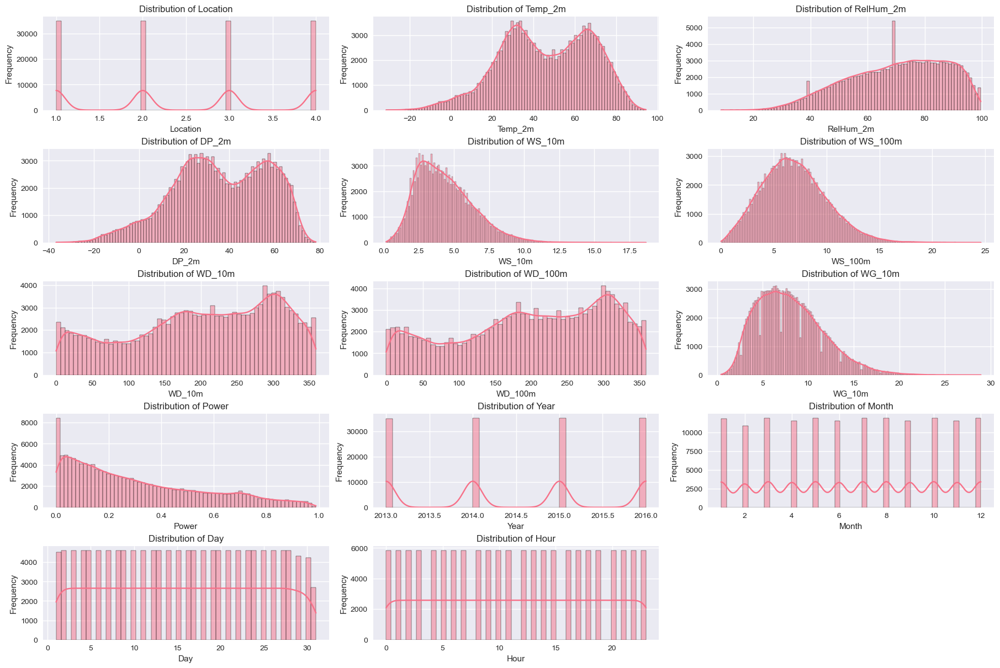

In [14]:
# Plot distribution of numerical features in a subplot using for loop
num_features = train_df.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumerical Features:", num_features)

# Create subplots for each numerical feature
n_rows = len(num_features) // 3 + (len(num_features) % 3 > 0)  # Calculate number of rows needed
n_cols = 3  # Fixed number of columns
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,
                         figsize=(18, 12),
                        #  gridspec_kw={'hspace': 0.5, # Vertical space between rows
                        #               'wspace': 0.4 # Horizontal space between columns
                        #               },
                         constrained_layout=True # Automatically adjust layout to prevent overlap, setting dynamic spacing
                         )
axes = axes.flatten()
for i, feature in enumerate(num_features):
    sns.histplot(train_df[feature], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency') 
    if i == len(num_features) - 1:
        axes[i].set_visible(False)  # Hide any unused subplots
#plt.tight_layout()

Distribution analysis (boxplots) in a single plot.

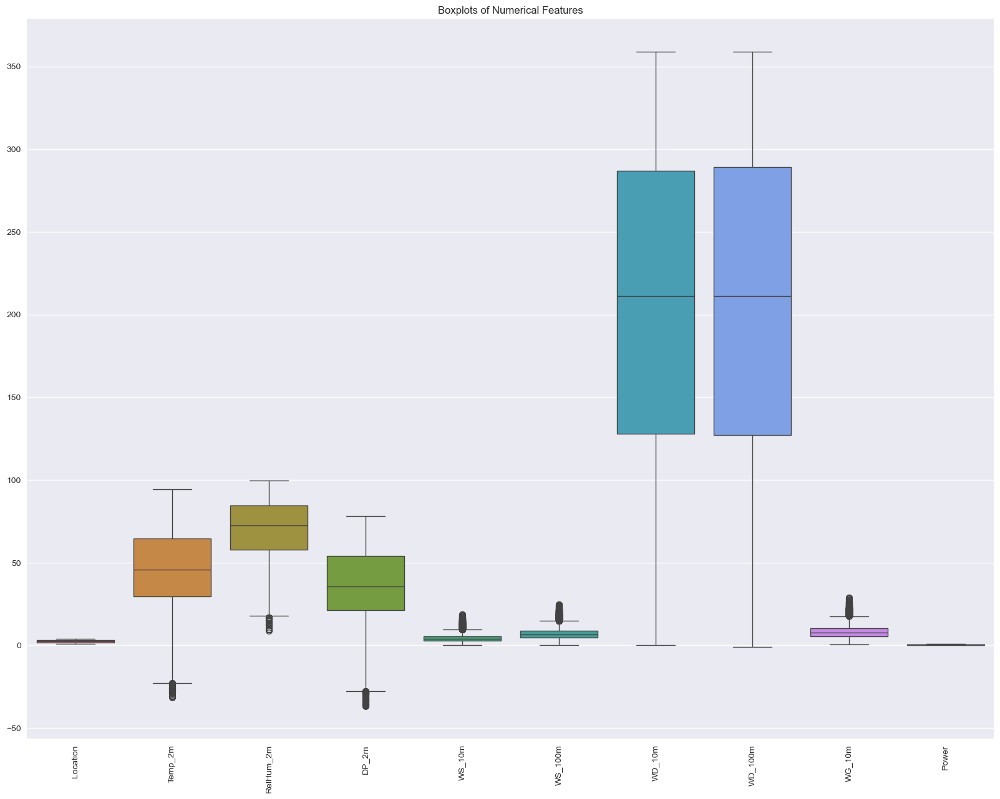

In [15]:
# Boxplots of numerical features
plt.figure(figsize=(20, 15))
sns.boxplot(data=train_df.iloc[:,:11].select_dtypes(include=[np.number])) # Columns with numerical data, selected based on histogram analysis
# Excluded Power column as it is the target variable and year, month, day, hour, and day of week are not numerical features
#sns.boxplot(data=train_df[num_features])
plt.xticks(rotation=90)
plt.title('Boxplots of Numerical Features')
plt.show()

In [16]:
# Select numerical columns for univariate analysis
num_features = train_df.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumerical Features:", num_features)



Numerical Features: ['Location', 'Temp_2m', 'RelHum_2m', 'DP_2m', 'WS_10m', 'WS_100m', 'WD_10m', 'WD_100m', 'WG_10m', 'Power', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek']


In [17]:
# Perform univariate analysis on numerical features
univariate_stats = get_df_univariate_stats(train_df[num_features], with_figures=False)
# Display univariate statistics
print("\nUnivariate Statistics:")
print(univariate_stats)


Univariate Statistics:
              type   count  missing  unique         mode          min  \
feature                                                                 
Location     int64  140160        0       4     1.000000     1.000000   
Temp_2m    float64  140160        0    1196    31.879600   -31.420400   
RelHum_2m  float64  140160        0      92    81.664205     8.664205   
DP_2m      float64  140160        0    1110    57.772595   -36.627405   
WS_10m     float64  140160        0    1310     3.775389     0.165389   
WS_100m    float64  140160        0    1858     6.807799     0.007799   
WD_10m     float64  140160        0     360   269.051683     0.051683   
WD_100m    float64  140160        0     361   306.057315    -0.942685   
WG_10m     float64  140160        0     263     6.536515     0.436515   
Power      float64  140160        0    9777    -0.000004    -0.000004   
Year         int32  140160        0       4  2016.000000  2013.000000   
Month        int32  140160 

In [18]:
# Interpretation of skewness and kurtosis:
# - Skewness indicates the asymmetry of the distribution. 
# A skewness close to 0 indicates a symmetric distribution, while positive skewness indicates a right-skewed distribution 
# and negative skewness indicates a left-skewed distribution.

# - Kurtosis indicates the "tailedness" of the distribution. 
# A kurtosis close to 0 indicates a normal distribution, while positive kurtosis indicates a distribution with heavier tails (more outliers) 
# and negative kurtosis indicates a distribution with lighter tails (fewer outliers).

# Function to interpret skewness and kurtosis

def interpret_skewness_kurtosis(skewness, kurtosis):
    """
    Interpret skewness and kurtosis values.
    
    Parameters:
    skewness (float): Skewness value.
    kurtosis (float): Kurtosis value.
    
    Returns:
    str: Interpretation of skewness and kurtosis.
    """
    if skewness > 0:
        skewness_desc = "right-skewed"
    elif skewness < 0:
        skewness_desc = "left-skewed"
    else:
        skewness_desc = "symmetric"
    
    if kurtosis > 0:
        kurtosis_desc = "heavy-tailed"
    elif kurtosis < 0:
        kurtosis_desc = "light-tailed"
    else:
        kurtosis_desc = "normal distribution"
    
    return f"Skewness: {skewness_desc}, Kurtosis: {kurtosis_desc}"

# Display interpretation of skewness and kurtosis for each numerical feature
print("\nInterpretation of Skewness and Kurtosis:")
for feature in num_features:
    skewness = univariate_stats.loc[feature, 'skewness']
    kurtosis = univariate_stats.loc[feature, 'kurtosis']
    interpretation = interpret_skewness_kurtosis(skewness, kurtosis)
    print(f"{feature}: {interpretation}")



Interpretation of Skewness and Kurtosis:
Location: Skewness: symmetric, Kurtosis: light-tailed
Temp_2m: Skewness: left-skewed, Kurtosis: light-tailed
RelHum_2m: Skewness: left-skewed, Kurtosis: light-tailed
DP_2m: Skewness: left-skewed, Kurtosis: light-tailed
WS_10m: Skewness: right-skewed, Kurtosis: heavy-tailed
WS_100m: Skewness: right-skewed, Kurtosis: heavy-tailed
WD_10m: Skewness: left-skewed, Kurtosis: light-tailed
WD_100m: Skewness: left-skewed, Kurtosis: light-tailed
WG_10m: Skewness: right-skewed, Kurtosis: heavy-tailed
Power: Skewness: right-skewed, Kurtosis: light-tailed
Year: Skewness: left-skewed, Kurtosis: light-tailed
Month: Skewness: left-skewed, Kurtosis: light-tailed
Day: Skewness: right-skewed, Kurtosis: light-tailed
Hour: Skewness: symmetric, Kurtosis: light-tailed
DayOfWeek: Skewness: left-skewed, Kurtosis: light-tailed


In [20]:
# - The 'Power' feature has a high standard deviation and skewness, indicating a wide range of values and a right-skewed distribution.
# - The 'Wind Speed' feature has a high mean and standard deviation, suggesting variability in wind speed across the dataset.

univariate_stats.loc[['WS_100m', 'Power'], ['mean', 'std', 'skewness', 'kurtosis']].round(2).T 

feature,WS_100m,Power
mean,6.92,0.31
std,3.06,0.25
skewness,0.49,0.73
kurtosis,0.42,-0.49


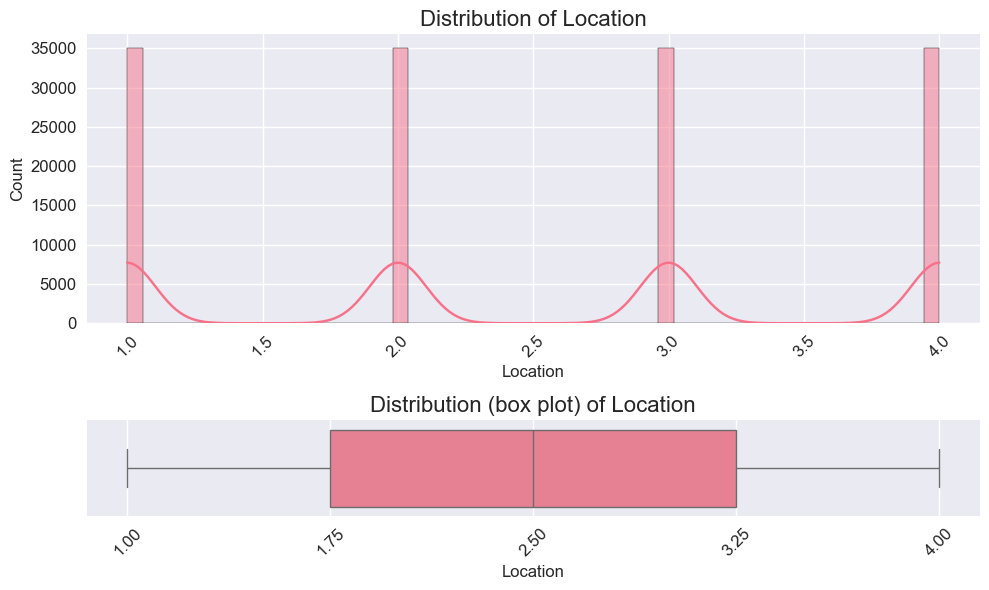

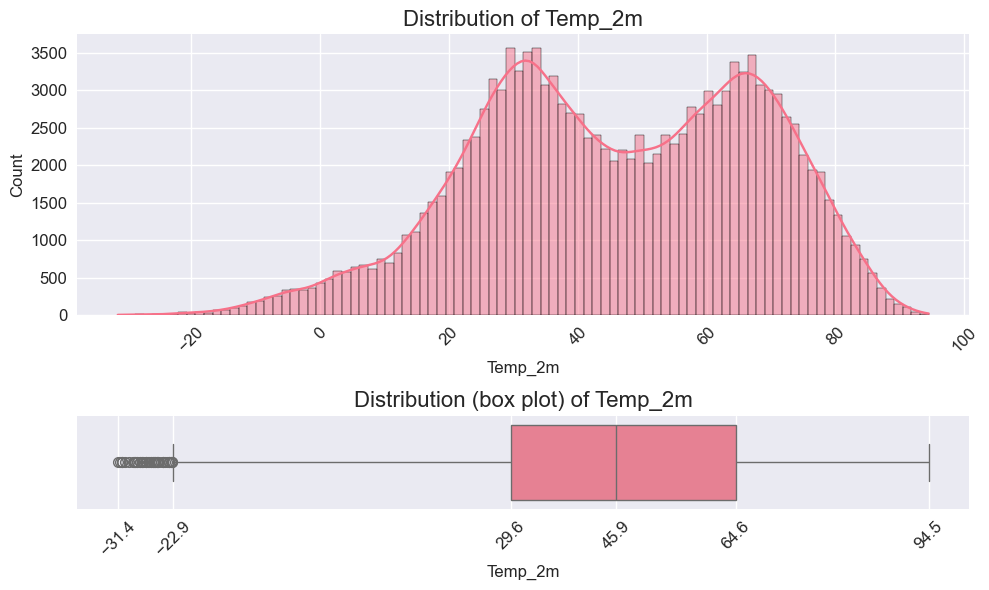

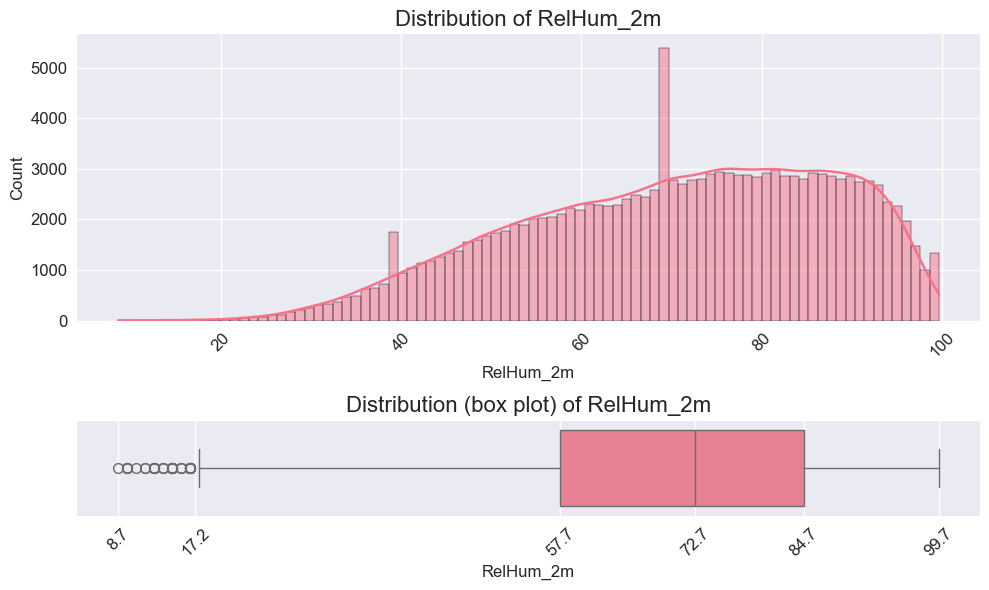

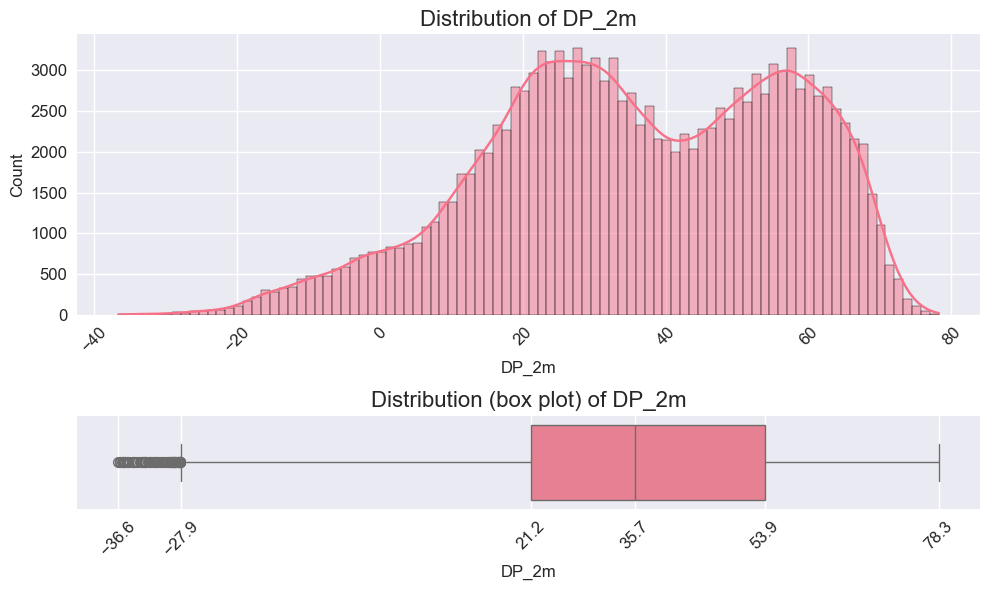

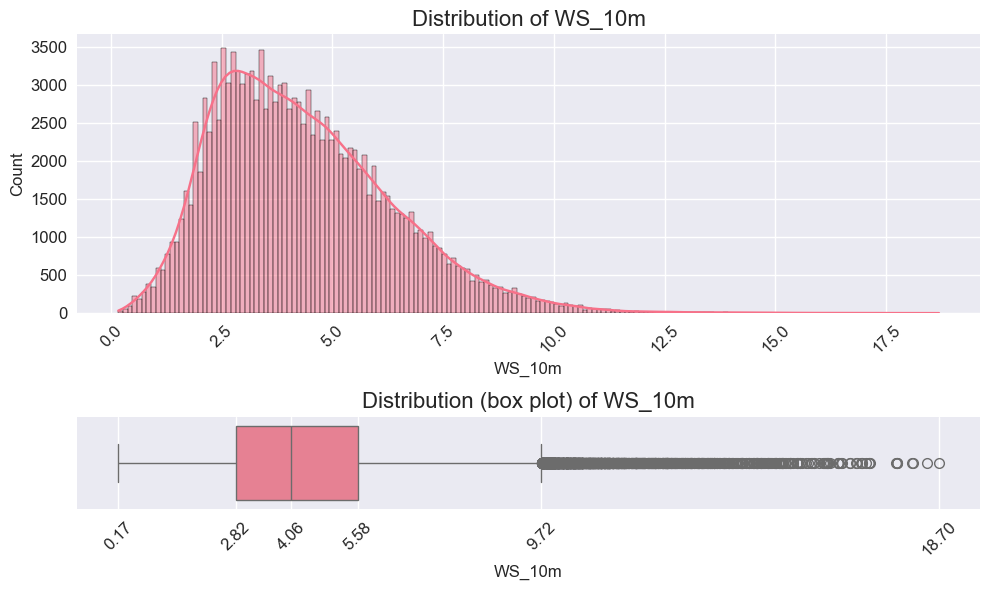

...

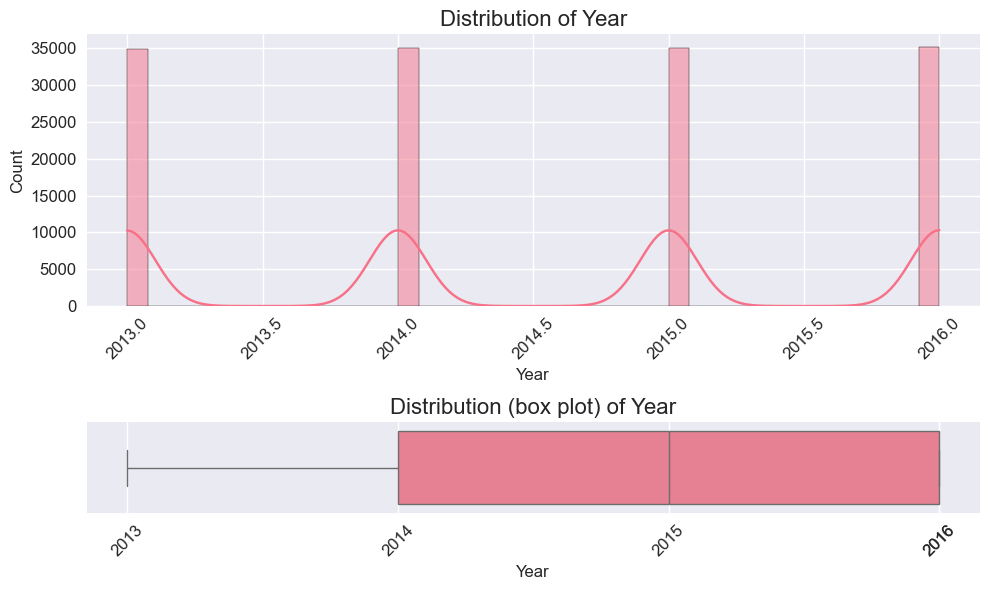

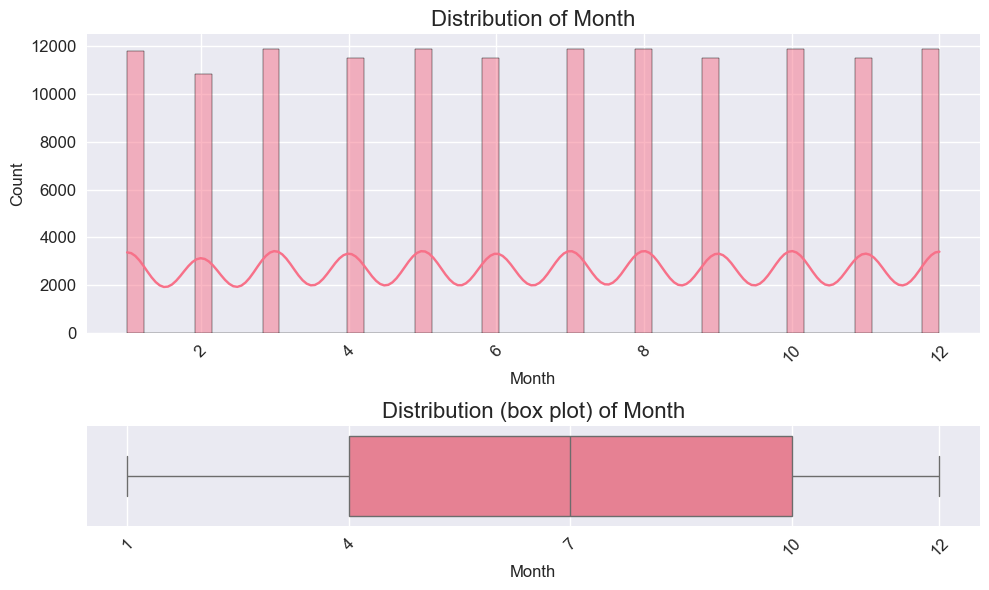

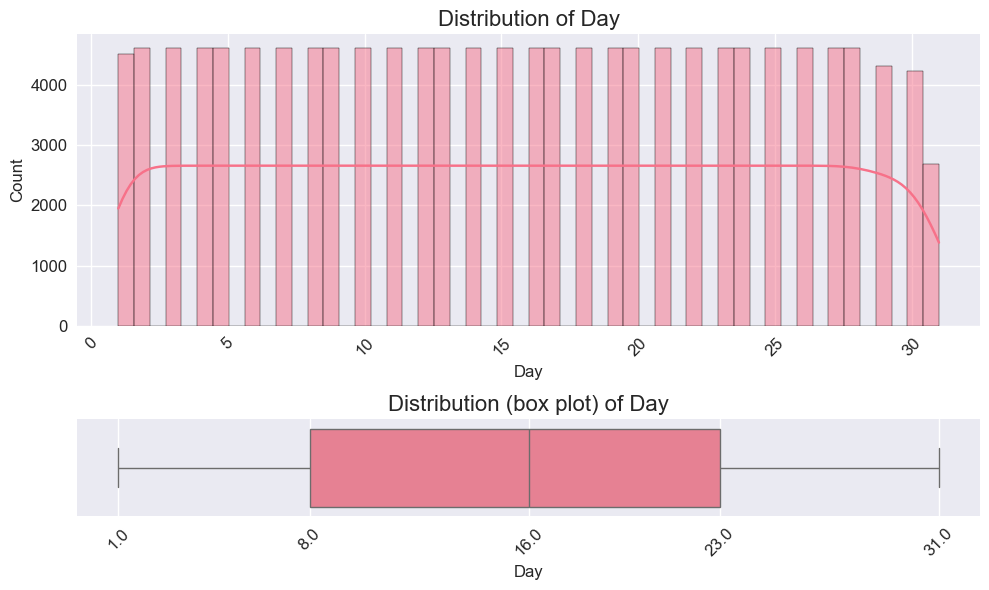

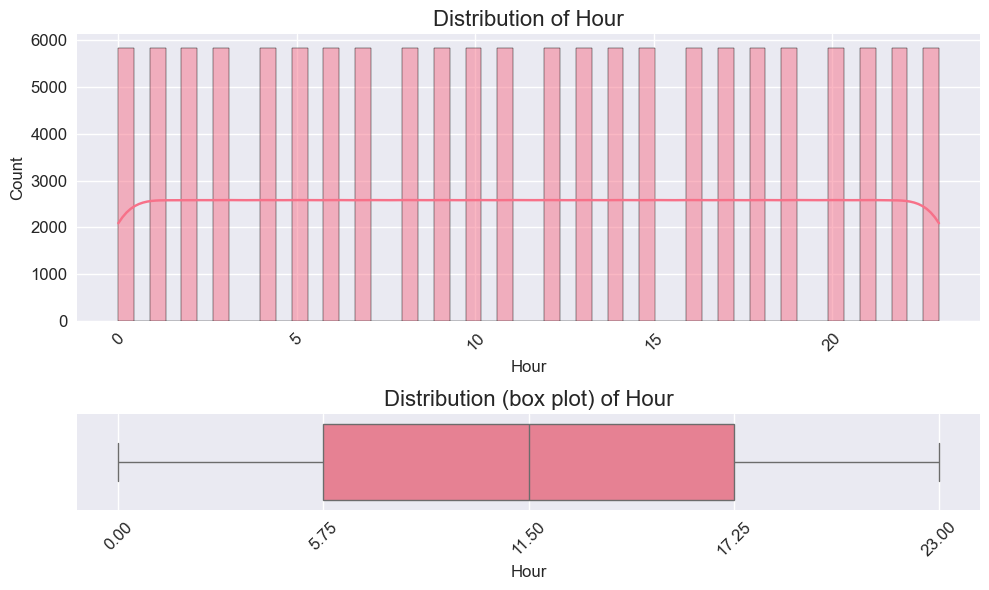

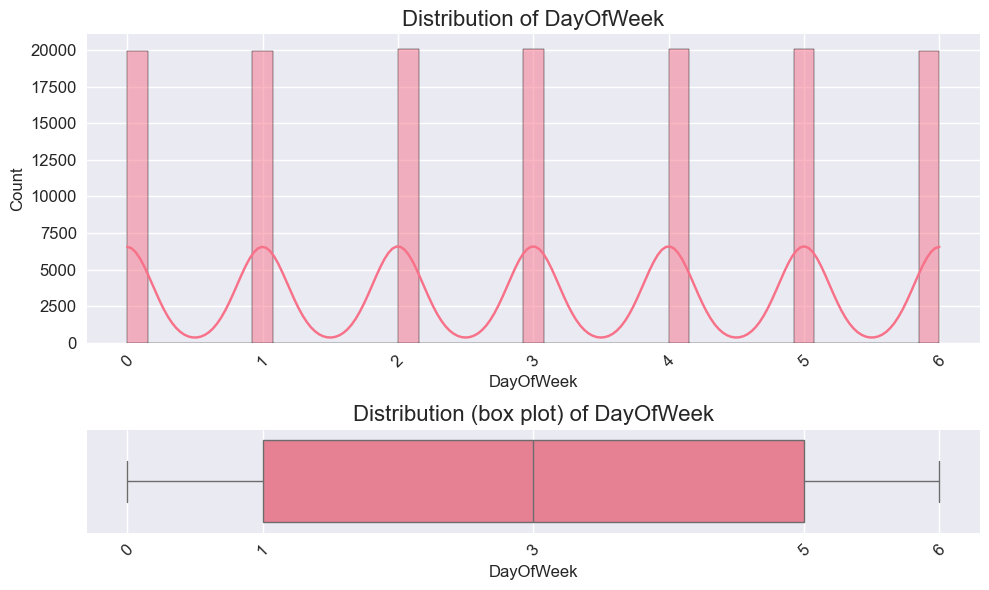

In [21]:
# Perform univariate analysis on numerical columns with figures of distribution
univariate_stats = get_df_univariate_stats(train_df[num_features], n_bins='auto', with_figures=True)


Outliers exists in the following numerical features
- Temp_2m
- RelHum_2m
- DP_2m
- WS_10m
- WS_100m
- WG_10m

#### 1.3.2 Correlation Analysis

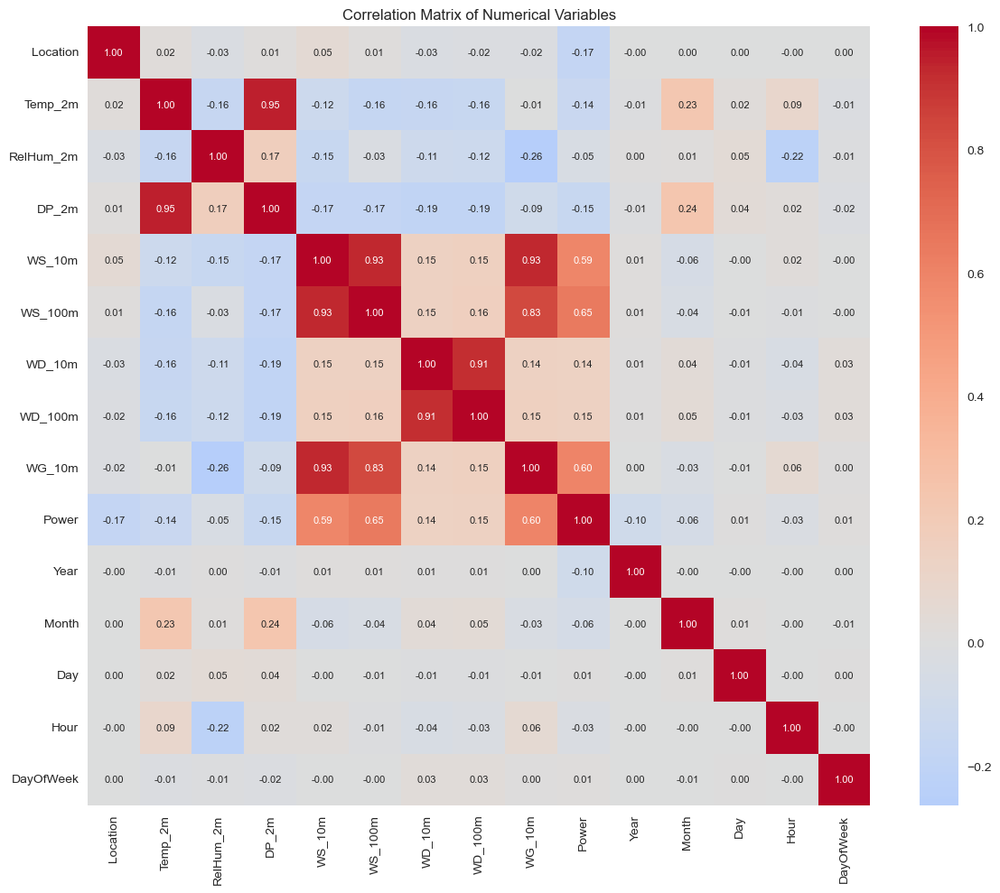

In [17]:
# Calculate correlations
corr_matrix = train_df.select_dtypes(include=[np.number]).corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            center=0, annot_kws={"size": 8})
#sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

# # plot half of the correlation matrix
# plt.figure(figsize=(12, 10))
# mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
# sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', mask=mask,center=0, annot_kws={"size": 8})    
# plt.title('Correlation Matrix of Numerical Variables (Upper Half)')
# plt.tight_layout()
# plt.show()


Temp_2m and DP_2m (Dew point at 2m) are highly positively correlated, correlation value 0.93 (Can drop DP_2m to avoid multicollinearity ) <br>
WS_10m and WS_100m are highly positively correlated, correlation value 0.91 <br>
WG_10m and WS100m are strongly positively correlated, correlation value 0.83

Highest positive correlation to power generation is shown by wind speed, especially at higher altitudes (100 m), with a correlation value of 0.65
whereas wind speed at 10m and wind gust at 10m are also positively correlated with power generation, but to a lesser extent (0.59 and 0.60 respectively).


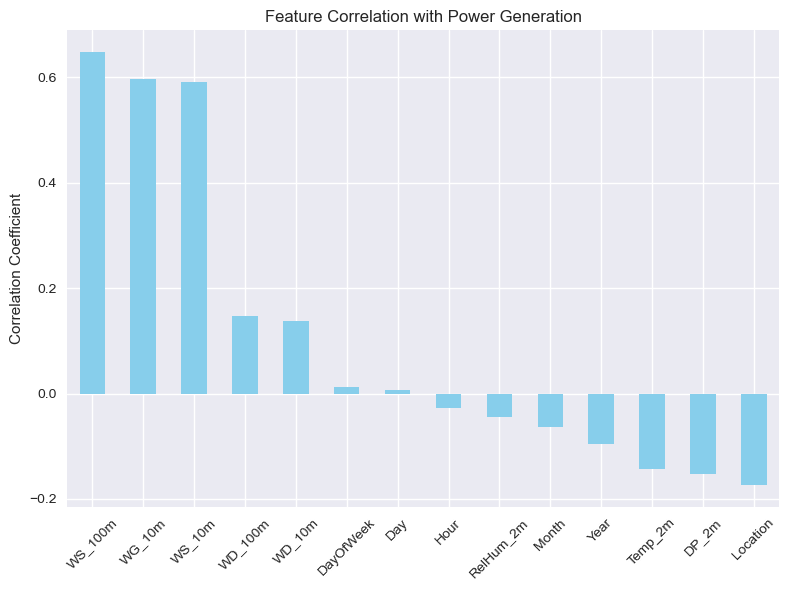

In [18]:
# Focus on correlations with Power
power_corr = corr_matrix['Power'].sort_values(ascending=False)
plt.figure(figsize=(8, 6))
power_corr.drop('Power').plot(kind='bar', color='skyblue')
plt.title('Feature Correlation with Power Generation')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

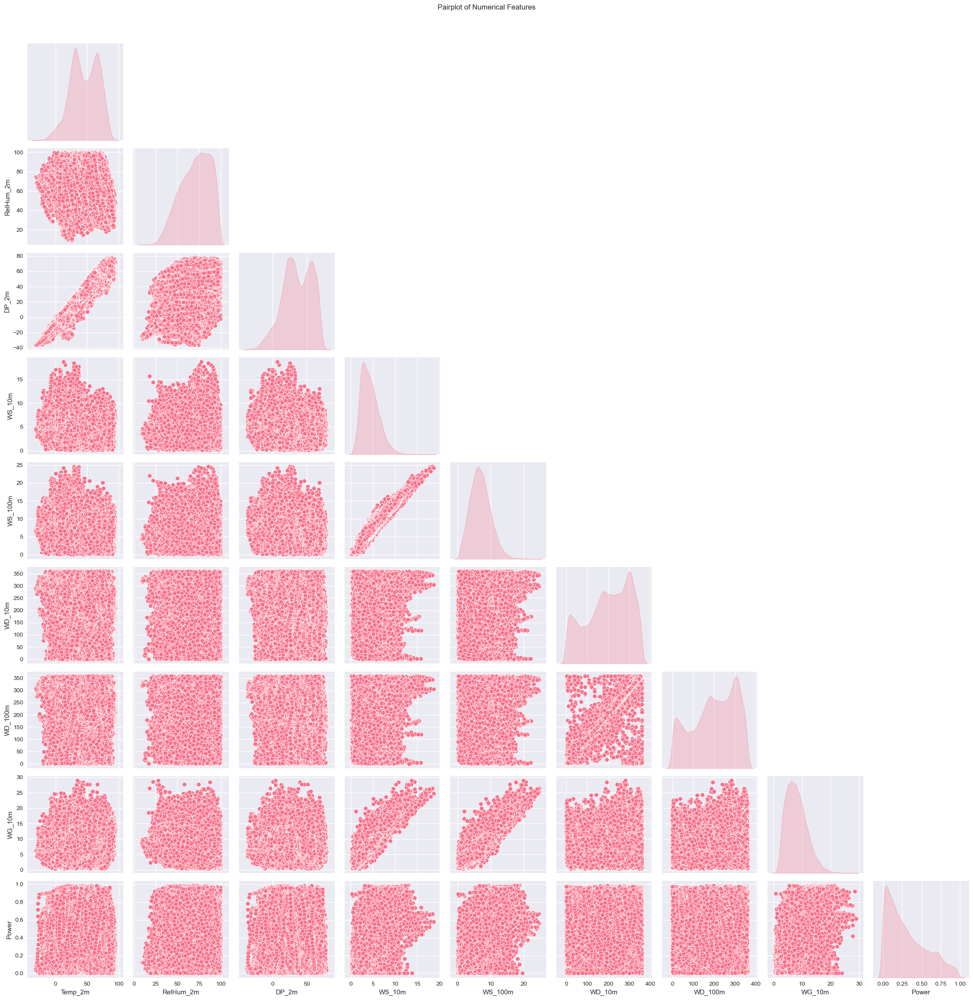

In [19]:
# Pairplot of numerical features
sns.pairplot(train_df.iloc[:, 2:11],
             diag_kind='kde',
             corner=True,)
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.tight_layout()


#### 1.3.3 Multivariate Analysis

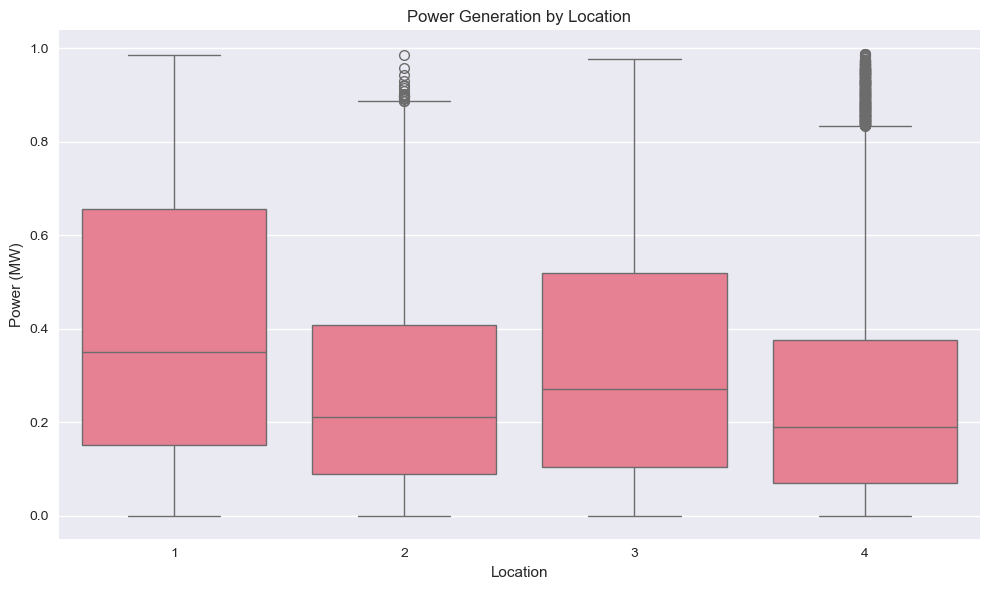

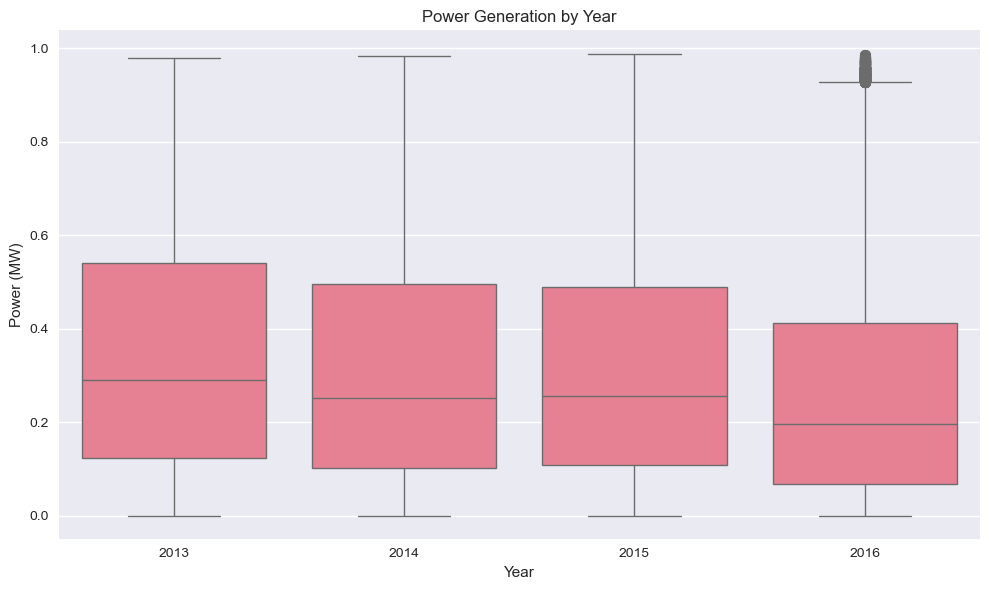

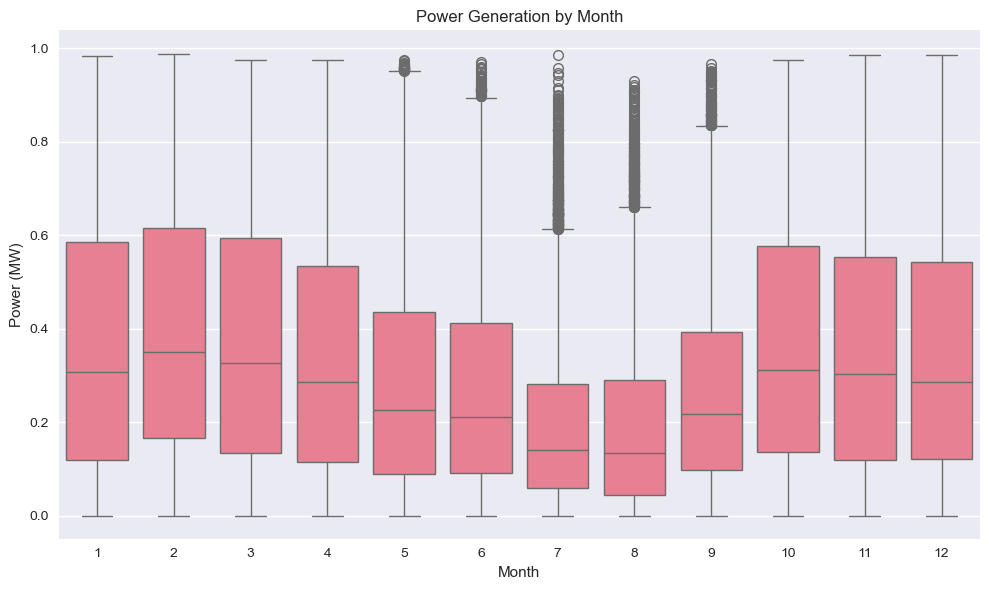

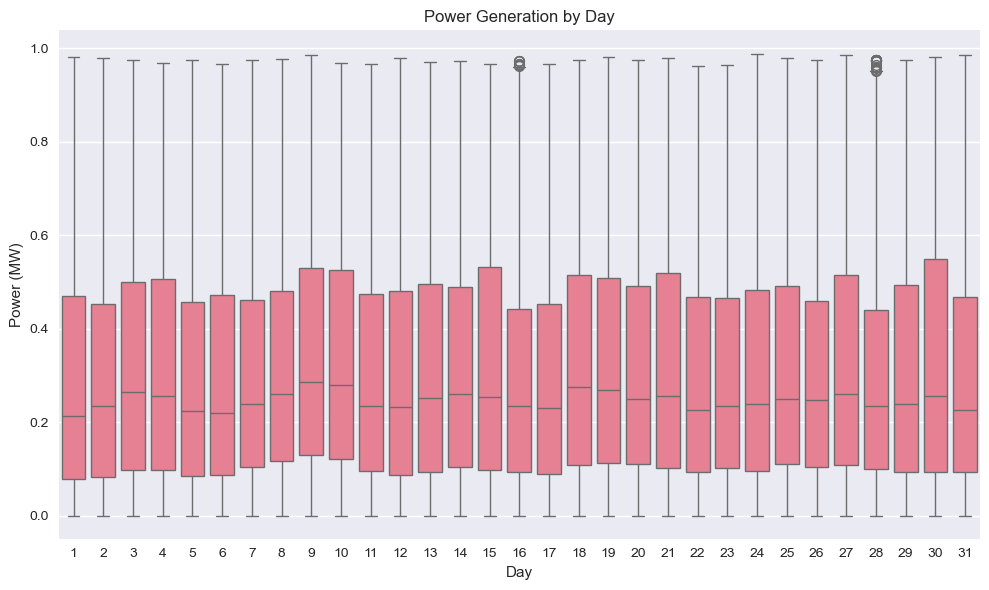

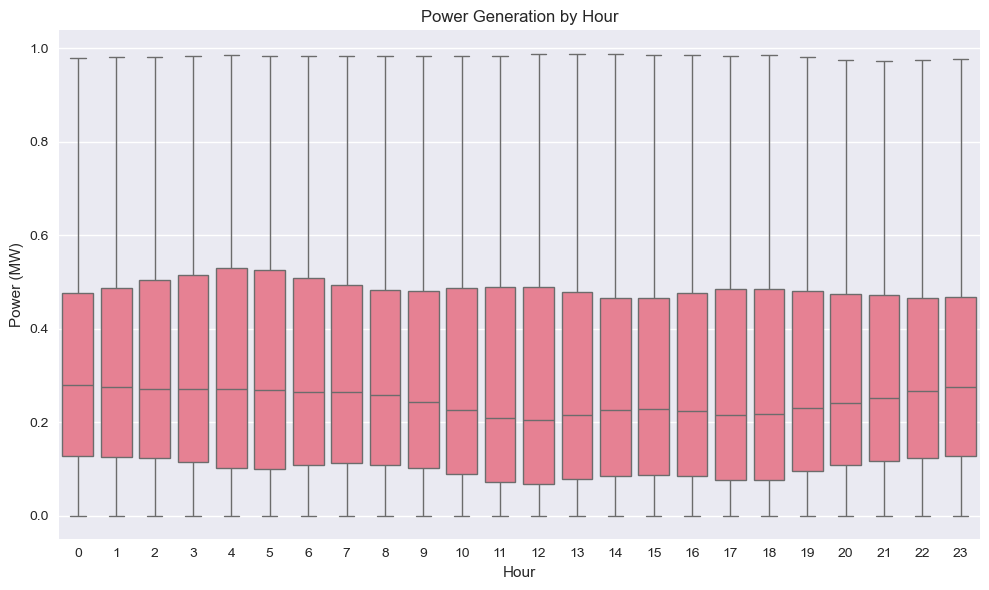

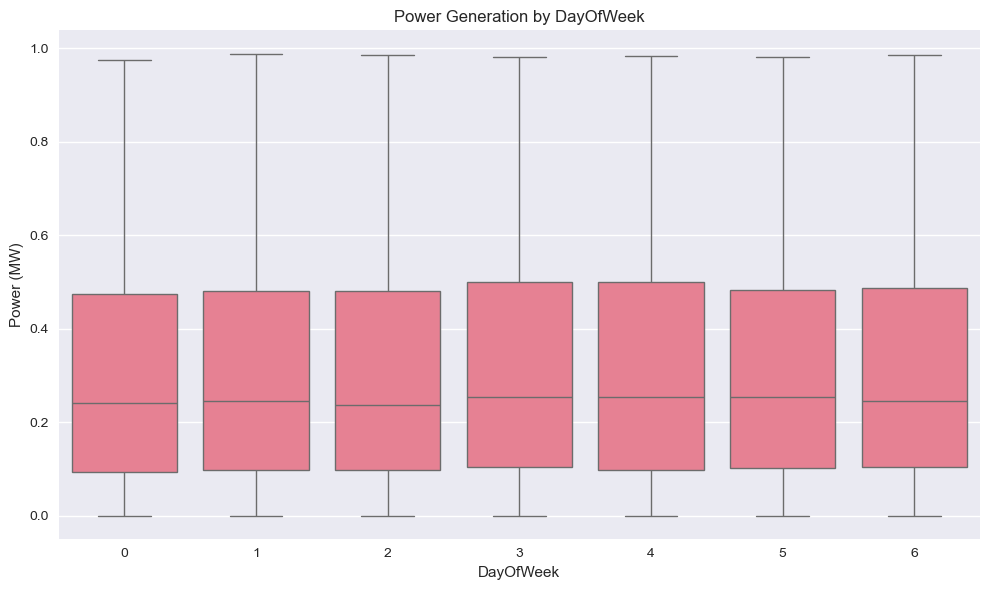

In [ ]:
# Power generation vs. location
def plot_power_by_cat_var(df, variable):
    """
    Plots power generation by a categorical variable.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    variable (str): The categorical variable to plot against power generation.
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[variable], y='Power', data=df)
    plt.title(f'Power Generation by {variable}')
    plt.ylabel('Power')
    plt.xlabel(variable)
    plt.tight_layout()
    plt.show()
    
# Plot power generation by categorical variables
for variable in ['Location', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek']:
    plot_power_by_cat_var(train_df, variable=variable)

#### 1.3.4 Wind Speed vs. Power Generation

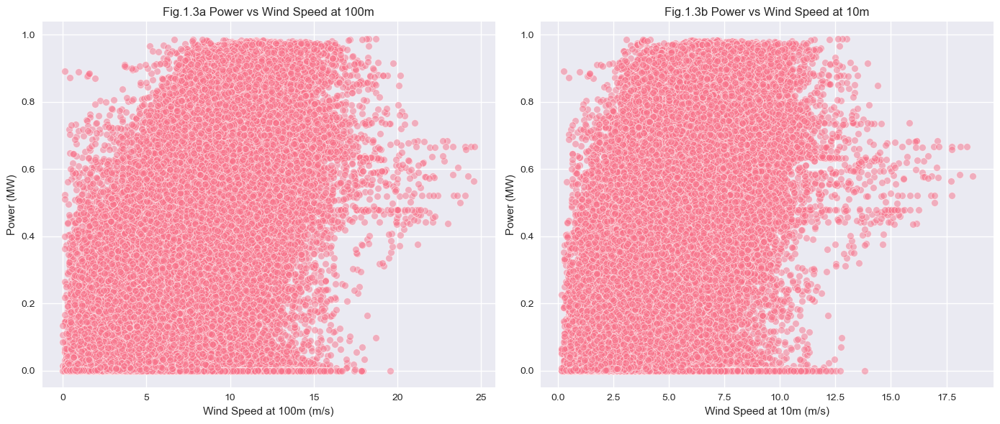

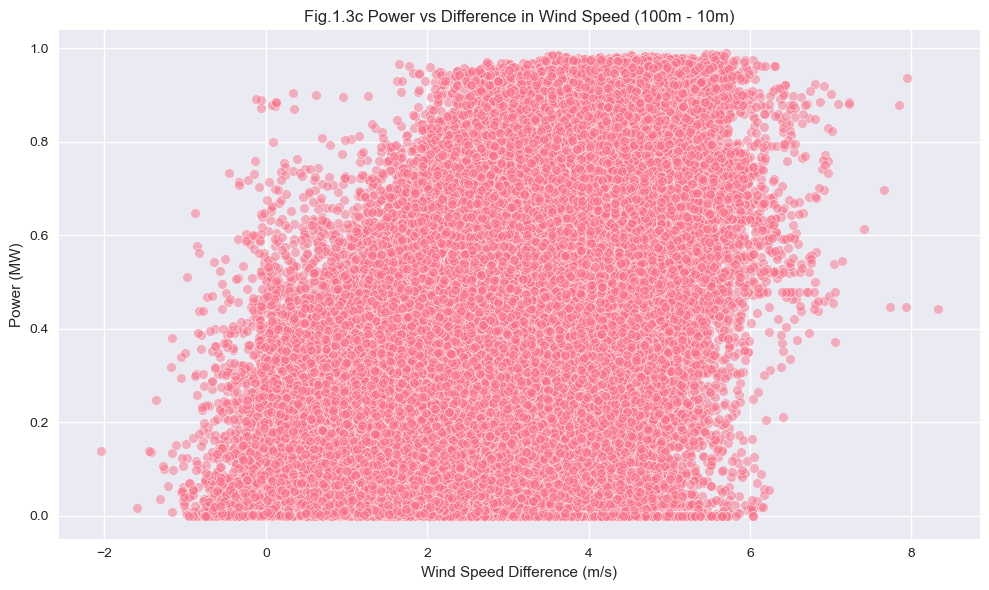

In [ ]:
# Wind speed analysis
plt.figure(figsize=(14, 6))

# Scatter plot of wind speed at 100m vs power
plt.subplot(1, 2, 1)
sns.scatterplot(x='WS_100m', y='Power', data=train_df, alpha=0.5)
#sns.regplot(x='WS_100m', y='Power', data=train_df, scatter=False, color='red', ax=plt.gca()) # Add regression line
plt.title('Fig.1.3a Power vs Wind Speed at 100m')
plt.xlabel('Wind Speed at 100m (m/s)')
plt.ylabel('Power  ')


# Scatter plot of wind speed at 10m vs power
plt.subplot(1, 2, 2)
sns.scatterplot(x='WS_10m', y='Power', data=train_df, alpha=0.5)
#sns.regplot(x='WS_10m', y='Power', data=train_df, scatter=False, color='red', ax=plt.gca()) # Add regression line
plt.title('Fig.1.3b Power vs Wind Speed at 10m')
plt.xlabel('Wind Speed at 10m (m/s)')
plt.ylabel('Power  ')

plt.tight_layout()
plt.show()

# Wind speed difference analysis
train_df['WS_diff'] = train_df['WS_100m'] - train_df['WS_10m']
plt.figure(figsize=(10, 6))
sns.scatterplot(x='WS_diff', y='Power', data=train_df, alpha=0.5)
#sns.regplot(x='WS_diff', y='Power', data=train_df, scatter=False, color='red', ax=plt.gca()) # Add regression line
plt.title('Fig.1.3c Power vs Difference in Wind Speed (100m - 10m)')
plt.xlabel('Wind Speed Difference (m/s)')
plt.ylabel('Power  ')
plt.tight_layout()
plt.show()

Since scatterplots suffer from overplotting, using hexbin plots or density contours.

<Figure size 1200x600 with 0 Axes>

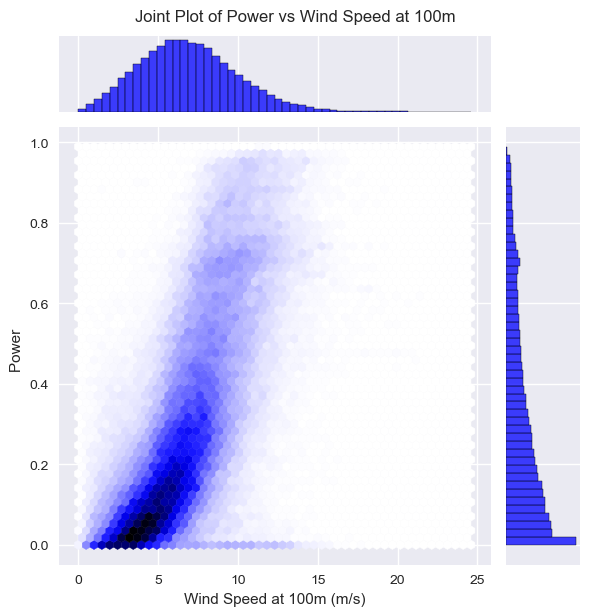

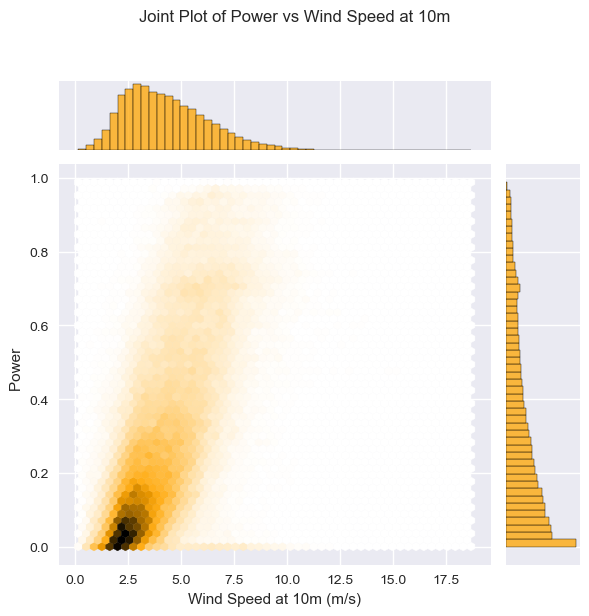

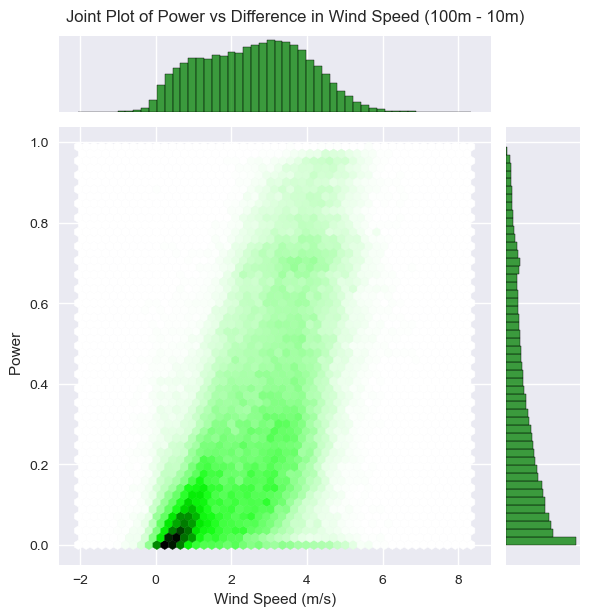

In [135]:
# Joint plot of wind speed at 100m vs power
#plt.figure(figsize=(10, 6))
plt.figure(figsize=(12, 6))
sns.jointplot(x='WS_100m', y='Power', data=train_df,
                kind='hex', color='blue', marginal_kws=dict(bins=50, fill=True))
plt.suptitle('Joint Plot of Power vs Wind Speed at 100m', y=1.02)
plt.xlabel('Wind Speed at 100m (m/s)')
plt.ylabel('Power  ')


# Joint plot of wind speed at 10m vs power
sns.jointplot(x='WS_10m', y='Power', data=train_df,
                kind='hex', color='orange', marginal_kws=dict(bins=50, fill=True))
plt.subplots_adjust(top=0.9)  # Adjust the top margin to fit the title
plt.suptitle('Joint Plot of Power vs Wind Speed at 10m', y=1.02)
plt.xlabel('Wind Speed at 10m (m/s)')
plt.ylabel('Power  ')

# Wind speed difference analysis
train_df['WS_diff'] = train_df['WS_100m'] - train_df['WS_10m']
sns.jointplot(x='WS_diff', y='Power', data=train_df,
                kind='hex', color='green', marginal_kws=dict(bins=50, fill=True))
plt.subplots_adjust(top=0.9)  # Adjust the top margin to fit the title
plt.tight_layout()
plt.suptitle('Joint Plot of Power vs Difference in Wind Speed (100m - 10m)', y=1.02)
plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Power   ')
plt.show()




Power vs Wind Speed at 100m
- A classic wind turbine power curve is visible, power increases with wind speed up to a point (~10–12 m/s), then saturates near the turbine's rated power (~1   ).

- After the rated speed, power doesn't increase further, possibly due to power capping or control mechanisms to prevent damage at high wind speeds.

- The scatter increases for higher wind speeds, likely due to control strategies, turbulence, or wind direction effects.

Power vs Wind Speed at 10m

- Similar shape but noticeably more scattered, particularly for higher wind speeds.

- Wind speed at 10m is less predictive of power generation than at 100m, which is expected because turbines are usually mounted at or around 100m hub height.

- This plot confirms height is important — 10m measurements introduce more noise due to surface friction, obstacles, etc

Comparing both plots justifies the use of hub-height (100m) wind speeds in modeling and forecasting, as it is more reliable and less noisy predictor.

Clearly visualizes the turbine power curve and supports further feature engineering.

Power vs Difference in Wind Speed (100m -10m) 

- Positive correlation: As the wind speed difference increases (i.e., stronger wind shear), power output increases.

- Wind speed difference can indicate vertical wind shear, which can impact turbine performance.

- Noise at low or negative values of difference (e.g., difference < 0) suggests possible anomalies or instrumentation noise — wind speed at 10m shouldn't usually exceed 100m

Highlights that wind shear (gradient) could be a meaningful feature for power prediction models.

Also helps identify anomalies (e.g., negative differences), which is critical for data cleaning and QC

In [ ]:
# compute correlation between wind speed at 100m and power generation
corr_ws_power = {
    'Wind Speed': ['100m', '10m', 'diff'],
    'correlation': [],
    'R2': []}
for ws in corr_ws_power['Wind Speed']:
    corr = train_df['Power'].corr(train_df[f'WS_{ws}'])
    corr_ws_power['correlation'].append(corr)
    corr_ws_power['R2'].append(corr ** 2)

# Create a DataFrame for correlation results
corr_df = pd.DataFrame(corr_ws_power)
# Round the correlation values to 2 decimal places
corr_df['correlation'] = np.round(corr_df['correlation'], 4)
corr_df['R2'] = np.round(corr_df['R2'], 4)
# Display the correlation DataFrame
print("\nCorrelation between Wind Speed and Power Generation:")
print(corr_df)

# correlation (r) is the Pearson correlation coefficient, which measures the linear relationship between two variables, 
# while R2 (coefficient of determination) represents the proportion of variance in the dependent variable (Power) that can be explained 
# by the independent variable (Wind Speed). R2 is always non-negative and ranges from 0 to 1, 
# where 0 indicates no explanatory power and 1 indicates perfect explanatory power.


Correlation between Wind Speed and Power Generation:
  Wind Speed  correlation      R2
0       100m       0.6481  0.4200
1        10m       0.5919  0.3503
2       diff       0.5669  0.3214


In addition to the visual exploration, statistical analysis confirms the strength of the relationship between wind speed and power output. 

Wind speed at 100m exhibits the highest correlation (r ≈ 0.65), explaining over 42% of the variance in power output (R² ≈ 0.42). <br>
Wind speed at 10m, while moderately correlated, introduces more variability. 

The vertical wind speed difference shows a moderate, yet notable relationship, suggesting the potential value of wind shear as a supporting feature in predictive models

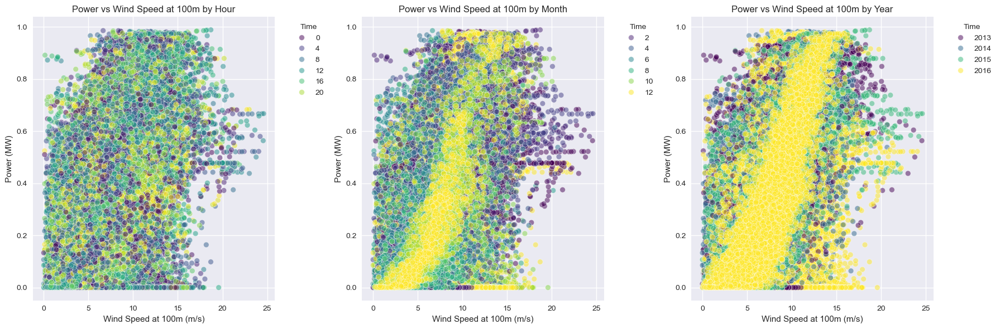

In [ ]:
# Color-coded scatter plots of wind speed at 100m vs power by time of day, month, and year
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
# Color-coded scatter plot of wind speed at 100m vs power by time of day
sns.scatterplot(x='WS_100m', y='Power', hue='Hour', data=train_df, palette='viridis', alpha=0.5, ax=axes[0])
axes[0].set_title('Power vs Wind Speed at 100m by Hour')
# Color-coded scatter plot of wind speed at 100m vs power by month
sns.scatterplot(x='WS_100m', y='Power', hue='Month', data=train_df, palette='viridis', alpha=0.5, ax=axes[1])
axes[1].set_title('Power vs Wind Speed at 100m by Month')
# Color-coded scatter plot of wind speed at 100m vs power by year
sns.scatterplot(x='WS_100m', y='Power', hue='Year', data=train_df, palette='viridis', alpha=0.5, ax=axes[2])
axes[2].set_title('Power vs Wind Speed at 100m by Year')
for ax in axes:
    ax.set_xlabel('Wind Speed at 100m (m/s)')
    ax.set_ylabel('Power   ')
    ax.legend(title='Time', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Temporal Effects on Wind Power Generation

To investigate temporal variability in wind power output, wind speed at 100m was plotted against power output with color encoding by hour of day, month, and year.
- By Hour: 
  - No strong diurnal trend is observed, suggesting that wind conditions at turbine hub height are relatively stable across daily cycles. This supports the assumption that hour-of-day may not significantly influence turbine output at this elevation.
- By Month: 
  - A clear seasonal pattern emerges. Winter months (e.g., December) show a higher concentration of high wind speeds and power outputs, while summer months correspond to lower wind availability. This seasonality is crucial for forecasting and planning and justifies the inclusion of seasonal features in predictive models.
- By Year: 
  - Turbine performance appears consistent across years. However, 2016 contains more data points, indicating either more frequent sampling or better wind resource availability. This analysis confirms temporal stability in turbine behavior and helps flag imbalances or potential outlier years for model validation.

#### 1.3.5 Time Series Analysis of Power Generation

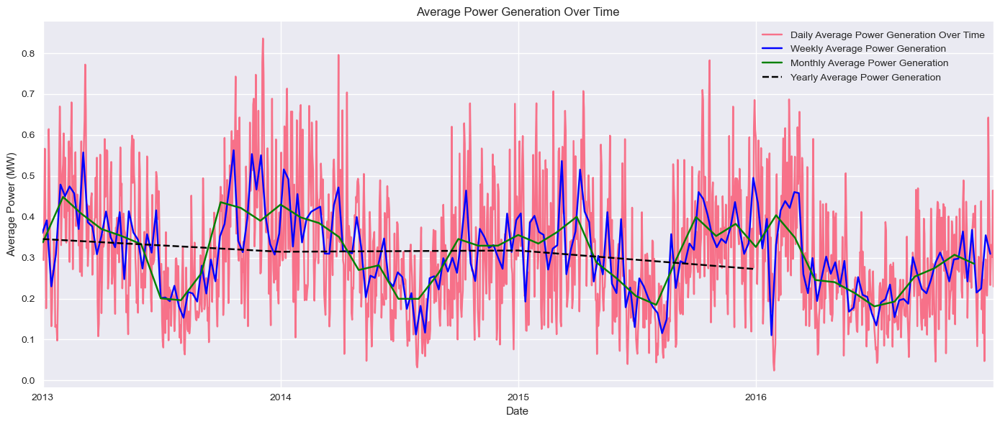

In [ ]:
# Resample to daily power generation for clearer visualization
daily_power = train_df.resample('D', on='Time')['Power'].mean()
# Plot daily average power generation over time
plt.figure(figsize=(14, 6))
daily_power.plot(label='Daily Average Power Generation Over Time')


# # Plot moving average to smooth the time series with a 30-day window
# moving_avg = daily_power.rolling(window=30).mean()
# moving_avg.plot(label='30-Day Moving Average', color='orange')


# Resample to weekly power generation for clearer visualization
weekly_power = train_df.resample('W', on='Time')['Power'].mean()
weekly_power.plot(label='Weekly Average Power Generation', color='blue')

# Resample to monthly power generation for clearer visualization
monthly_power = train_df.resample('ME', on='Time')['Power'].mean()
monthly_power.plot(label='Monthly Average Power Generation', color='green')

# Resample to yearly power generation for clearer visualization
yearly_power = train_df.resample('YE', on='Time')['Power'].mean()
yearly_power.plot(label='Yearly Average Power Generation', color='black', linestyle='--')

plt.legend()
plt.title('Average Power Generation Over Time')
plt.xlabel('Date')
plt.ylabel('Average Power   ')
plt.grid(True)
plt.tight_layout()
plt.show()

Seasonal cycle is visible in the daily average power generation.<br>
Decompose the time series to analyze trend, seasonality, and residuals.

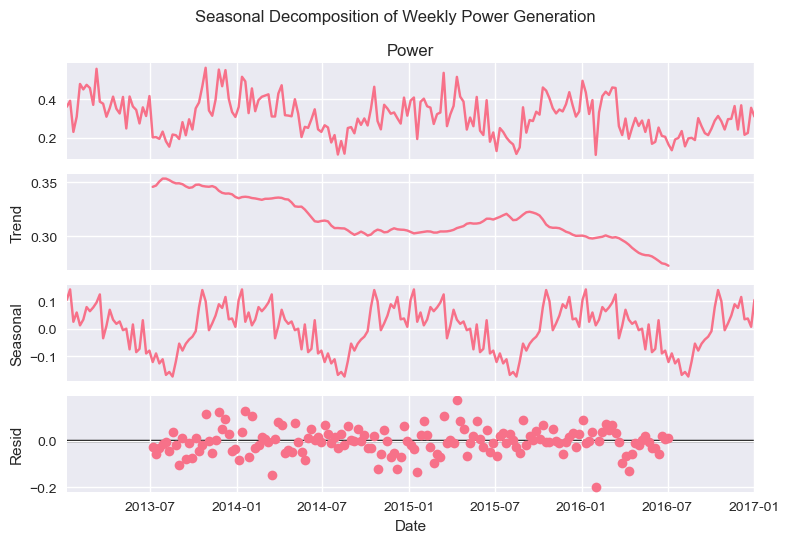

In [26]:
# Seasonal decomposition
weekly_power = train_df.resample('W', on='Time')['Power'].mean()
result = seasonal_decompose(weekly_power, model='additive', period=52)

# type(result)
# help(result)

result.plot()
plt.suptitle('Seasonal Decomposition of Weekly Power Generation')
plt.xlabel('Date')
plt.tight_layout()
plt.show()

The raw data shows fluctuations in weekly power generation, with some peaks and troughs. <br>
The overall trend appears to be relatively stable, but there are noticeable seasonal patterns. <br>
The trend is relatively flat with minor fluctuations, suggesting no significant long-term increase or decrease in power generation during the observed period (2013-2017).<br>
Clear weekly seasonality with regular peaks and troughs (amplitude ~±0.1)
- Possible drivers:
    - Weekly demand cycles (e.g., lower on weekends).
    - Maintenance schedules (e.g., turbines serviced on specific weekdays).

Random scatter around zero, but a few outliers suggest occasional anomalies (e.g., extreme weather, grid issues).
  - Investigate outliers (e.g., mid-2015 dip).

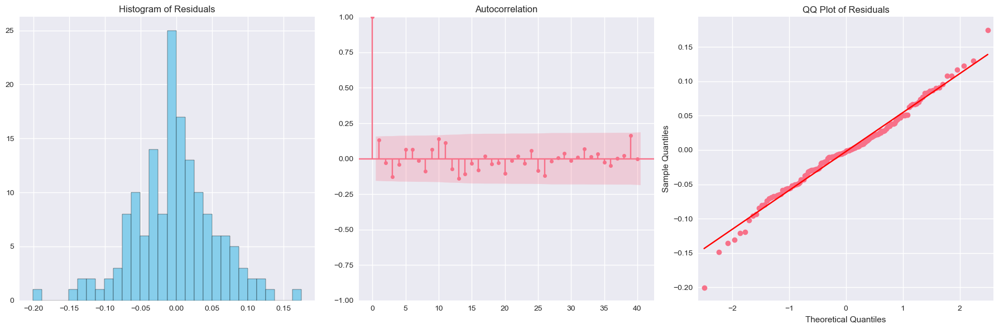

In [ ]:
# Plot a histogram, ACF and QQ plot of the residuals in a subplot to check for normality of residuals
# which validate the assumptions of the model used for time series analysis.
# If the residuals are normally distributed, it indicates that the model has captured the underlying patterns in the data well.

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.gofplots import qqplot

residuals = result.resid.dropna()
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].hist(residuals, bins=30, color='skyblue', edgecolor='black')
axes[0].set_title('Histogram of Residuals') 
plot_acf(residuals, lags=40, ax=axes[1])
qqplot(residuals, line='s', ax=axes[2])
axes[2].set_title('QQ Plot of Residuals')
plt.tight_layout()
plt.show()


- Residual diagnostics confirm the additive seasonal decomposition (period=52) effectively isolated trend and seasonality, leaving uncorrelated, near-normal distribution (Q-Q plot) with low noise (Histogram). (i.e. After modeling, white noise is ideal)
- The ACF shows no significant lagged correlations, and the Q-Q plot indicates approximate normality. 
- Minor outliers in the residuals (|values| > 0.15) warrant contextual review but do not undermine model validity (Histogram).

<Figure size 1000x600 with 0 Axes>

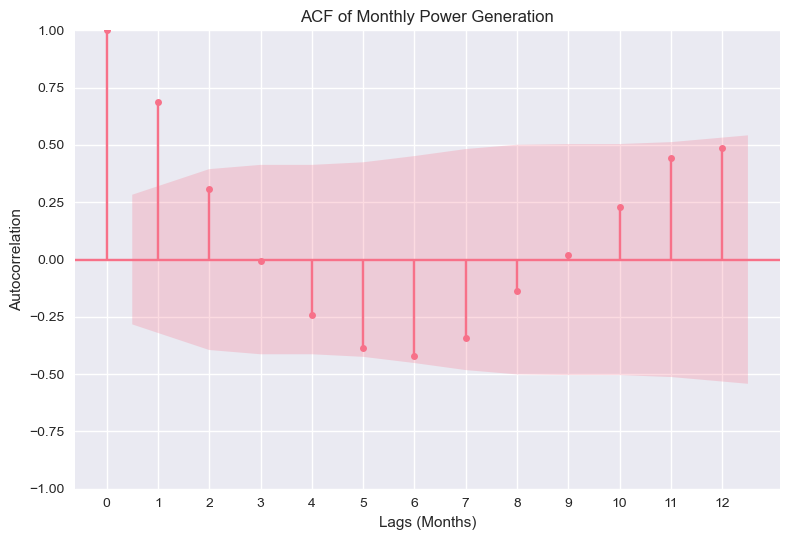

In [ ]:
# ACF for monthly power generation
from statsmodels.graphics.tsaplots import plot_acf
monthly_power = train_df.resample('ME', on='Time')['Power'].mean()
plt.figure(figsize=(10, 6))
plot_acf(monthly_power, lags=12, alpha=0.05)
plt.title('ACF of Monthly Power Generation')
plt.xticks(range(0, 13, 1))  # Set x-ticks to show lags in months
plt.xlabel('Lags (Months)')
plt.ylabel('Autocorrelation')
plt.tight_layout()
plt.show()

One month lag is prominent in the ACF plot, indicating a potential seasonal pattern in monthly power generation data.

<Figure size 1000x600 with 0 Axes>

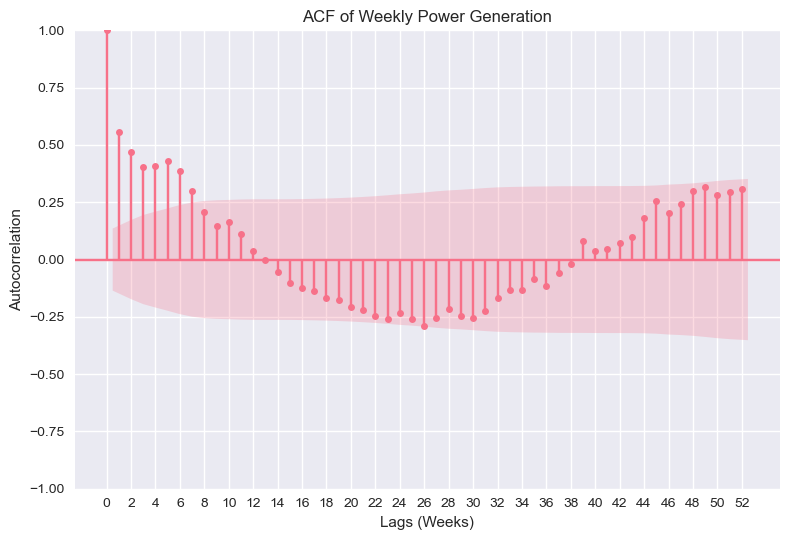

In [29]:
# ACF for weekly power generation
weekly_power = train_df.resample('W', on='Time')['Power'].mean()
plt.figure(figsize=(10, 6))
plot_acf(weekly_power, lags=52)
plt.title('ACF of Weekly Power Generation')
plt.xticks(range(0, 53, 2))  # Set x-ticks for better readability
plt.xlabel('Lags (Weeks)')
plt.ylabel('Autocorrelation')
plt.tight_layout()
plt.show()


The first 3 lags and 6th lag of ACF for weekly power generation are significant, after which the autocorrelation drops off quickly and becomes insignificant.<br>
This suggests that there is a weekly seasonality (~ 3 weeks) in the data, as well as some short-term dependencies.


##### Assess short-term forecasting (up to 2 days) readiness

If the goal is short-term forecasting (e.g. to reveal operational dynamics such as turbine response to wind changes), check ACF/PCF for short term lags.

<Figure size 1200x600 with 0 Axes>

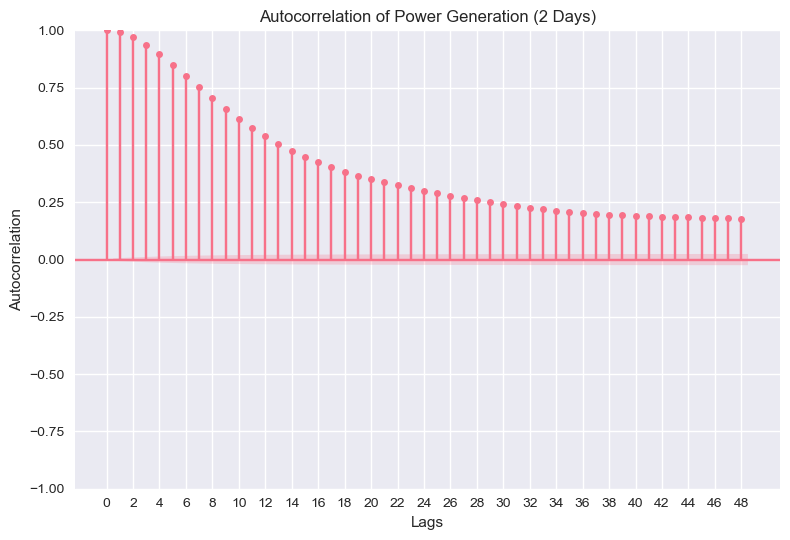

In [30]:
# Plot ACF of the Power column to check for autocorrelation during the first 48 hours (2 days) of hourly data.
# This figure shows the autocorrelation of the Power column, which can help identify any patterns or periodicity in the data.

from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(train_df['Power'], lags=48, alpha=0.05)  # lags=48 for 2 days of hourly data with significance level of 0.05
plt.title('Autocorrelation of Power Generation (2 Days)') 
plt.xticks(range(0, 49, 2))  # Show every second lag for clarity
plt.grid(True)
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.tight_layout()
plt.show()


ACF plot (for 2 days of hourly data) shows that the power generation isn't random and depends on recent history

1. Short-Term Autocorrelation (Lags 1–5)
- Significant Spikes at Early Lags:
    - The strong positive autocorrelation at Lag 1 (and possibly Lags 2–5) indicates that power generation is highly dependent on its immediate past values.
    - Wind power output is persistent over short time intervals (e.g., hours or days), likely due to weather systems (wind speeds) having inertia.

2. Decay Pattern
- Gradual Decline: The ACF decays slowly but remains significant for multiple lags, suggesting:
    - Long-range dependence: Power generation isn’t purely random; past values influence future values beyond just the immediate lag.
    - Potential non-stationarity: If the ACF decays very slowly, the series may need differencing, a method of transforming a non-stationary time series into a stationary one, (but this plot alone isn’t conclusive).

3. Seasonal Peaks are not visible as ACF plotted just for 2 days with hourly data

4. Statistical Significance
- All spikes outside the shaded bands (≈±0.1 for 95% confidence) are statistically significant.
- Key Lags: Focus on Lags 1–10, where autocorrelation is strongest.

Actionable Conclusions
- Model Selection:
    - Use ARIMA/SARIMA models (account for short-term autocorrelation) for short term power generation.
    - Since seasonality exists according to daily average power generation plot, check (Partial Autocorrelation Function) PACF or decompose the series.
- Feature Engineering:
    - Include lagged power values (e.g., Power_lag1, Power_lag2) as predictors in regression models.

The ACF for short term lags (48 hours) reveals strong short-term autocorrelation (Lags 1–5), suggesting wind power generation is influenced by recent values. 

Limitations & Next Steps
- Check PACF: To distinguish between AR (autoregressive) and MA (moving average) effects.
- Test Stationarity: Run an ADF/KPSS (Augmented Dickey Fuller test and Kwiatkowski-Phillips-Schmidt-Shin) test if the slow decay suggests non-stationarity.
- Cross-Correlation: Plot ACF of residuals after modeling to validate assumptions.

ACF Plot (for short term):
- Slow decay → Suggests non-stationarity (may need differencing, d > 0).
- Significant spikes at early lags → Potential moving average (MA) terms (q > 0).

<Figure size 1200x600 with 0 Axes>

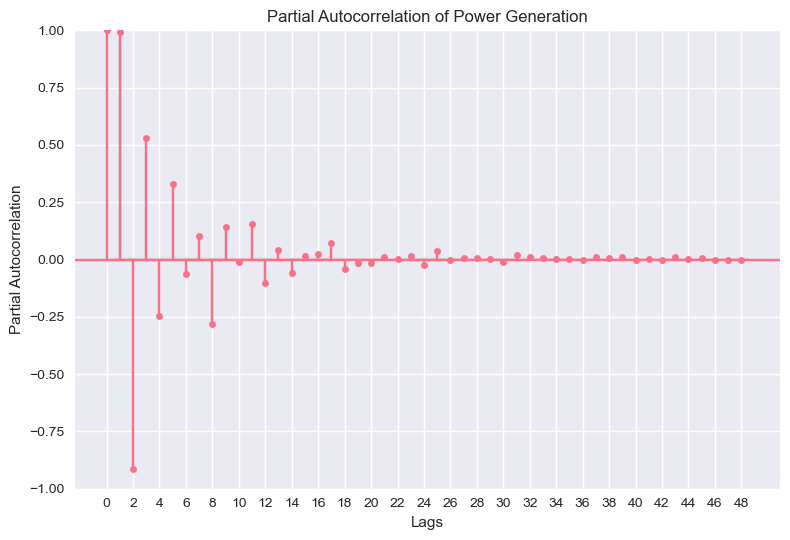

In [31]:
# Plot PACF of the Power column to check for partial autocorrelation.
# The Pacf answers the question: "If we already know yesterday's power generation, how much does power generation two days ago still contribute to predicting today's power generation?" 
# This figure shows the partial autocorrelation of the Power column, which can help identify the direct relationship between the Power values at different lags, removing the influence of intermediate lags.

from statsmodels.graphics.tsaplots import plot_pacf  

plt.figure(figsize=(12, 6))  
plot_pacf(train_df['Power'], lags=48, method='ols', alpha=0.05)  # OLS method for clarity  

# # Add arrow annotation to indicate the significance level
# plt.annotate('Significance Level', xy=(10, 0.2), xytext=(15, 0.3),
#              arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),
#              fontsize=10, color='black', ha='center')

plt.title('Partial Autocorrelation of Power Generation')  
plt.xticks(range(0, 49, 2))  # Show every second lag for clarity
plt.grid(True)
plt.xlabel('Lags')  
plt.ylabel('Partial Autocorrelation')  
plt.tight_layout()  
plt.show()  

PACF Plot (Recommended):
- A sharp cutoff after lag p → Indicates AR(p) model.
- Example: If PACF cuts off after Lag 2, use AR(2).

AR Signature
- PACF spikes at Lags 1, 2, then cuts off → Use AR(2).
- ACF decays exponentially

Based on the ACF:
- Differencing (d): If ACF decays very slowly, try d=1 and re-plot.
- AR Order (p): Check where PACF cuts off (e.g., Lag 1 → p=1).
- MA Order (q): Check where ACF cuts off (e.g., Lag 1 → q=1).

Hypothesis: ACF suggests short-term dependence (Lags 1–5), so:
- Start with ARIMA(1,0,1) or ARIMA(2,0,0) and validate with AIC/BIC

The ACF shows persistent short-term correlation, while the PACF cuts off after Lag 2, suggesting an AR(2) model. <br>
Differencing may not be needed (ACF decays moderately).<br>
Further testing with ADF/KPSS for stationarity (ie. the statistical properties of a time series remaining constant over time) 

##### Stationarity test

Stationarity test are conducted to check if the time series data is stationary, which assesses whether the statistical properties of the series, such as mean and variance, remain constant over time. <br>
Stationarity checks are necessary for time series analysis, especially when building models like ARIMA or SARIMA.

In [32]:
# ADF test for stationarity
# The null and alternate hypothesis of this test are:
# Null Hypothesis: The series has a unit root.
# Alternate Hypothesis: The series has no unit root.
# If the null hypothesis in failed to be rejected, this test may provide evidence that the series is non-stationary.

from statsmodels.tsa.stattools import adfuller
result = adfuller(train_df['Power'])
print("\nADF Test Results:")
print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")
if result[1] < 0.05:
    print("The time series is stationary (reject null hypothesis).")
else:
    print("The time series is non-stationary (fail to reject null hypothesis).")


ADF Test Results:
ADF Statistic: -27.17148117495948
p-value: 0.0
The time series is stationary (reject null hypothesis).


In [33]:
# KPSS test for stationarity

# The null and alternate hypothesis for the KPSS test are opposite that of the ADF test.
# Null Hypothesis: The process is trend stationary.
# Alternate Hypothesis: The series has a unit root (series is not stationary).

from statsmodels.tsa.stattools import kpss
result_kpss = kpss(train_df['Power'], regression='c')
print("\nKPSS Test Results:")
print(f"KPSS Statistic: {result_kpss[0]}")
print(f"p-value: {result_kpss[1]}")
if result_kpss[1] < 0.05:
    print("The time series is non-stationary (reject null hypothesis).")
else:
    print("The time series is stationary (fail to reject null hypothesis).")



KPSS Test Results:
KPSS Statistic: 10.025354447964633
p-value: 0.01
The time series is non-stationary (reject null hypothesis).


C:\Users\Lasitha\AppData\Local\Temp\ipykernel_24768\3531531385.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result_kpss = kpss(train_df['Power'], regression='c')


In [ ]:
# Possible outcomes of applying these stationary tests are as follows:
# Case 1: Both tests conclude that the series is not stationary - The series is not stationary
# Case 2: Both tests conclude that the series is stationary - The series is stationary
# Case 3: KPSS indicates stationarity and ADF indicates non-stationarity - The series is trend stationary. Trend needs to be removed to make series strict stationary. The detrended series is checked for stationarity.
# Case 4: KPSS indicates non-stationarity and ADF indicates stationarity - The series is difference stationary. Differencing is to be used to make series stationary. The differenced series is checked for stationarity.

# Source: https://www.statsmodels.org/dev/examples/notebooks/generated/stationarity_detrending_adf_kpss.html


#### 1.3.5 Temporal Patterns

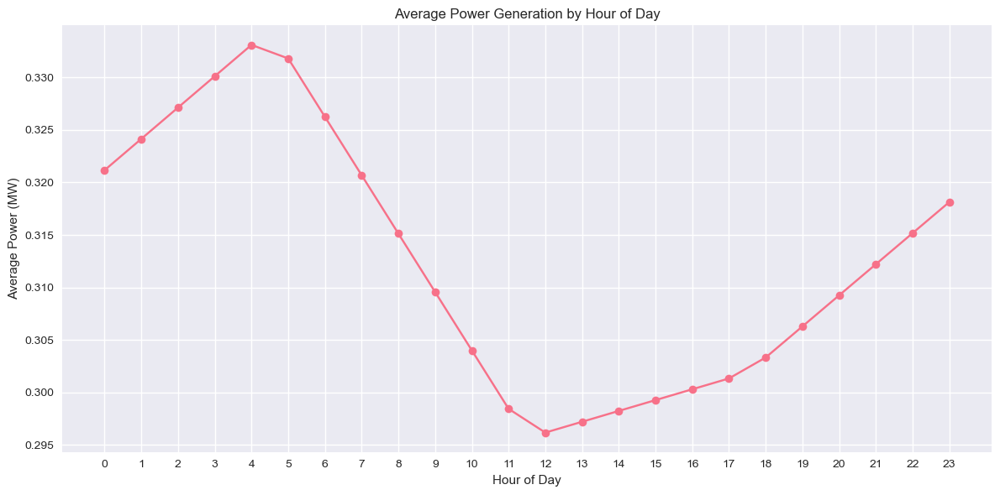

In [ ]:
# Hourly patterns
hourly_pattern = train_df.groupby('Hour')['Power'].mean()

plt.figure(figsize=(12, 6))
hourly_pattern.plot(marker='o')
plt.title('Average Power Generation by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Power   ')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()

Hourly power generation
- Peak Hours: During nighttime, gradually increase from 6 pm till 4 am and then decreases
- Daytime Dip: Lower generation at daytime (10 am - 6 pm) due to lower wind speed or reduce demand
  - Average wind speed at 100m by hour of day figure shown below implies lower generation at daytime is due to lower wind speed
- Actionable Insight: Align turbine maintenance or battery storage charging with low-generation hours

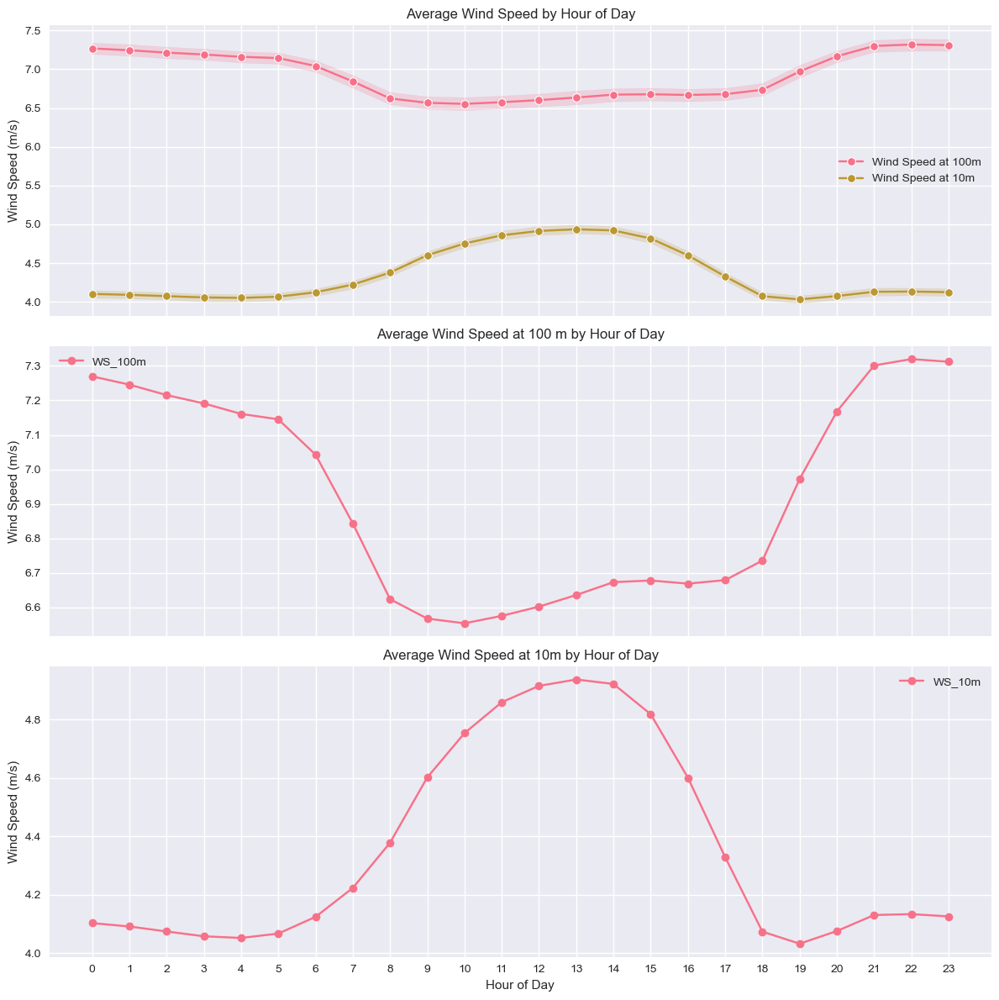

In [35]:
# Plot average wind speed at 100m and 10m by hour of day
# Create a figure with subplots for wind speed at 100m and 10m

fig, axes = plt.subplots(3,1, figsize=(12, 12), sharex=True)

sns.lineplot(x='Hour', y='WS_100m', data=train_df, label='Wind Speed at 100m', marker='o', ax=axes[0])
sns.lineplot(x='Hour', y='WS_10m', data=train_df, label='Wind Speed at 10m', marker='o', ax=axes[0])
axes[0].set_title('Average Wind Speed by Hour of Day')
axes[0].set_ylabel('Wind Speed (m/s)')
axes[0].legend()

# Plot average wind speed at 100m by hour of day
hourly_ws_100m = train_df.groupby('Hour')['WS_100m'].mean()
axes[1].plot(hourly_ws_100m.index, hourly_ws_100m, marker='o', label='WS_100m')
axes[1].set_title('Average Wind Speed at 100 m by Hour of Day')
axes[1].set_ylabel('Wind Speed (m/s)')
axes[1].legend()

# Plot average wind speed at 10m by hour of day
hourly_ws_10m = train_df.groupby('Hour')['WS_10m'].mean()
axes[2].plot(hourly_ws_10m.index, hourly_ws_10m, marker='o', label='WS_10m')
axes[2].set_title('Average Wind Speed at 10m by Hour of Day')
axes[2].set_xlabel('Hour of Day')
axes[2].set_ylabel('Wind Speed (m/s)')
axes[2].legend()

plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()


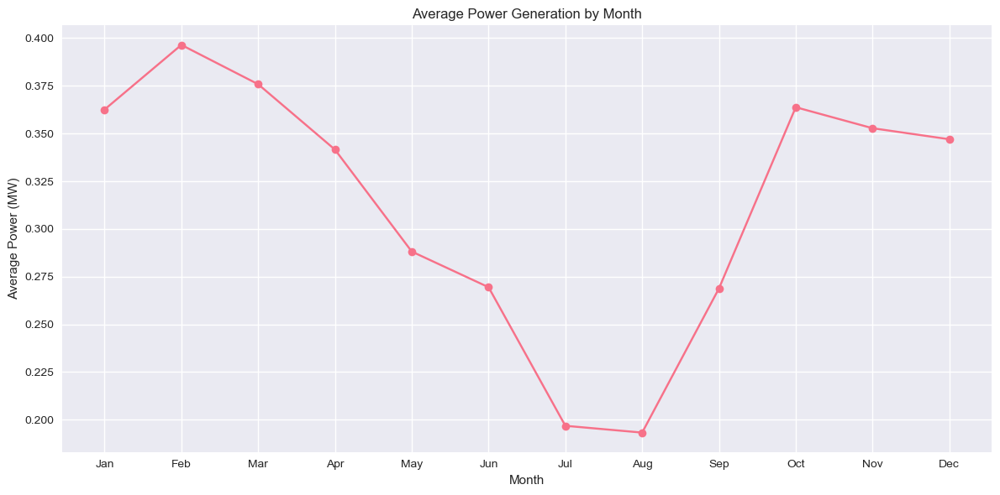

In [ ]:
# Monthly patterns
monthly_pattern = train_df.groupby('Month')['Power'].mean()

plt.figure(figsize=(12, 6))
monthly_pattern.plot(marker='o')
plt.title('Average Power Generation by Month')
plt.xlabel('Month')
plt.ylabel('Average Power   ')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()

Monthly power generation
- Seasonal Peaks:
    - Highest in Winter (December-February), then spring (March–May) and autumn (September–November), possibly high-wind seasons.
    - Lowest in summer (June–August) due to calm weather
- Interpretation:
    - Wind resource availability follows predictable seasonal cycles, critical for energy planning.

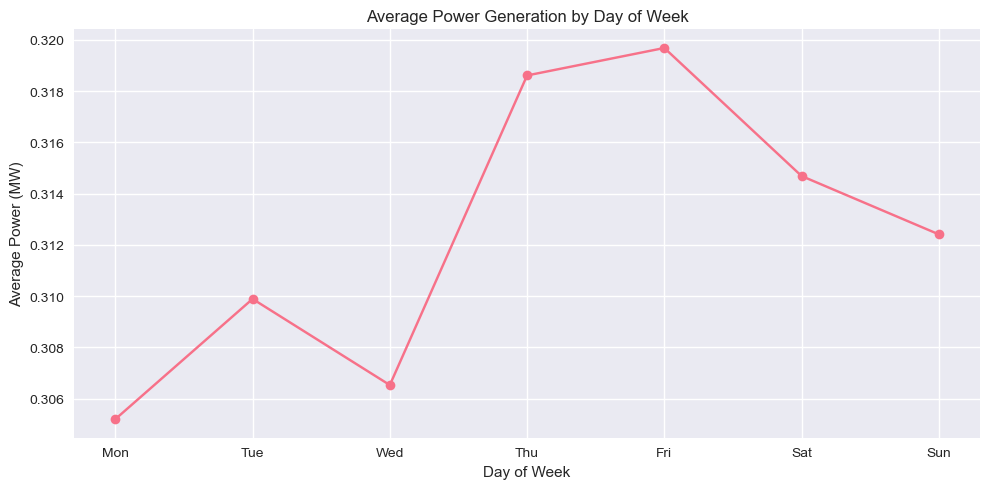

In [ ]:
# Weekday patterns
weekday_pattern = train_df.groupby('DayOfWeek')['Power'].mean()

plt.figure(figsize=(10, 5))
weekday_pattern.plot(marker='o')
plt.title('Average Power Generation by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Average Power   ')
plt.xticks(range(0, 7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True)
plt.tight_layout()
plt.show()

Slightly higher generation on weekdays (e.g., Monday–Friday) if tied to grid demand patterns

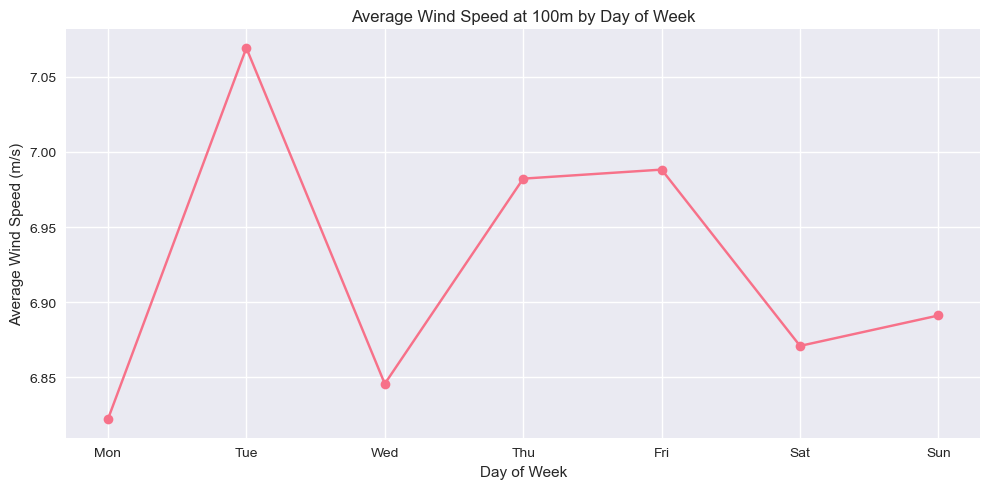

In [39]:
# wind speed at 100m by day of week
weekday_ws_100m = train_df.groupby('DayOfWeek')['WS_100m'].mean()
plt.figure(figsize=(10, 5))
weekday_ws_100m.plot(marker='o')
plt.title('Average Wind Speed at 100m by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Average Wind Speed (m/s)')
plt.xticks(range(0, 7), ['Mon', 'Tue', 'Wed',
                            'Thu', 'Fri', 'Sat', 'Sun'])
plt.grid(True)
plt.tight_layout()
plt.show()

- The weekly power generation pattern does not resembles with weekly wind speed patterns shown above. 
- This suggests that power generation is influenced by factors beyond just wind speed, such as grid demand or operational constraints.

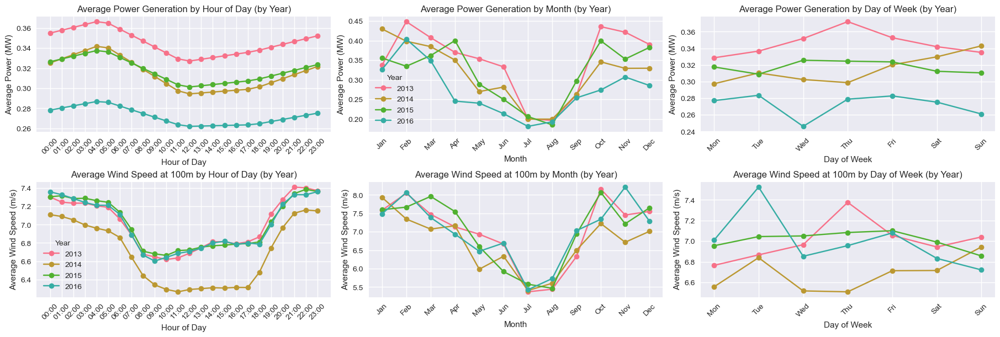

In [ ]:
# Create subplots for hourly, monthly, and weekday wind power patterns by year and wind speed at 100m by year

fig, axes = plt.subplots(2, 3,
                         figsize=(18, 6),
                         #sharey=True,
                         constrained_layout=True # Automatically adjust layout to prevent overlap, setting dynamic spacing
                         )

axes = axes.flatten()
# Plotting hourly, monthly, and weekday patterns for both Power and Wind Speed at 100m by Year

# Hourly patterns by year
for year in train_df['Year'].unique():
    hourly_pattern_year = train_df[train_df['Year'] == year].groupby('Hour')['Power'].mean()
    axes[0].plot(hourly_pattern_year.index, hourly_pattern_year.values, marker='o', label=str(year))
axes[0].set_title('Average Power Generation by Hour of Day (by Year)')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Average Power   ')
#axes[0].legend(title='Year')
axes[0].set_xticks(range(0, 24))
axes[0].set_xticklabels([f'{h:02d}:00' for h in range(24)], rotation=45)

# Monthly patterns by year
for year in train_df['Year'].unique():
    monthly_pattern_year = train_df[train_df['Year'] == year].groupby('Month')['Power'].mean()
    axes[1].plot(monthly_pattern_year.index, monthly_pattern_year.values, marker='o', label=str(year))
axes[1].set_title('Average Power Generation by Month (by Year)')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Average Power   ')
axes[1].legend(title='Year')
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                         'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)

# Weekday patterns by year
for year in train_df['Year'].unique():
    weekday_pattern_year = train_df[train_df['Year'] == year].groupby('DayOfWeek')['Power'].mean()
    axes[2].plot(weekday_pattern_year.index, weekday_pattern_year.values, marker='o', label=str(year))
axes[2].set_title('Average Power Generation by Day of Week (by Year)')
axes[2].set_xlabel('Day of Week')
axes[2].set_ylabel('Average Power   ')
#axes[2].legend(title='Year')
axes[2].set_xticks(range(0, 7))
axes[2].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)

# Hourly patterns by year
for year in train_df['Year'].unique():
    hourly_pattern_year = train_df[train_df['Year'] == year].groupby('Hour')['WS_100m'].mean()
    axes[3].plot(hourly_pattern_year.index, hourly_pattern_year.values, marker='o', label=str(year))
axes[3].set_title('Average Wind Speed at 100m by Hour of Day (by Year)')
axes[3].set_xlabel('Hour of Day')
axes[3].set_ylabel('Average Wind Speed (m/s)')
axes[3].legend(title='Year')
axes[3].set_xticks(range(0, 24))
axes[3].set_xticklabels([f'{h:02d}:00' for h in range(24)], rotation=45)

# Monthly patterns by year
for year in train_df['Year'].unique():
    monthly_pattern_year = train_df[train_df['Year'] == year].groupby('Month')['WS_100m'].mean()
    axes[4].plot(monthly_pattern_year.index, monthly_pattern_year.values, marker='o', label=str(year))
axes[4].set_title('Average Wind Speed at 100m by Month (by Year)')
axes[4].set_xlabel('Month')
axes[4].set_ylabel('Average Wind Speed (m/s)')
#axes[4].legend(title='Year')
axes[4].set_xticks(range(1, 13))
axes[4].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                         'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)

# Weekday patterns by year
for year in train_df['Year'].unique():
    weekday_pattern_year = train_df[train_df['Year'] == year].groupby('DayOfWeek')['WS_100m'].mean()
    axes[5].plot(weekday_pattern_year.index, weekday_pattern_year.values, marker='o', label=str(year))
axes[5].set_title('Average Wind Speed at 100m by Day of Week (by Year)')
axes[5].set_xlabel('Day of Week')
axes[5].set_ylabel('Average Wind Speed (m/s)')
#axes[5].legend(title='Year')
axes[5].set_xticks(range(0, 7))
axes[5].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=45)


#plt.tight_layout() 
plt.show()


Overall increase or decrease in power generation by the year is not directly related to wind speed and my be influenced by other factors such as changes in turbine technology, maintenance practices, or operational strategies.

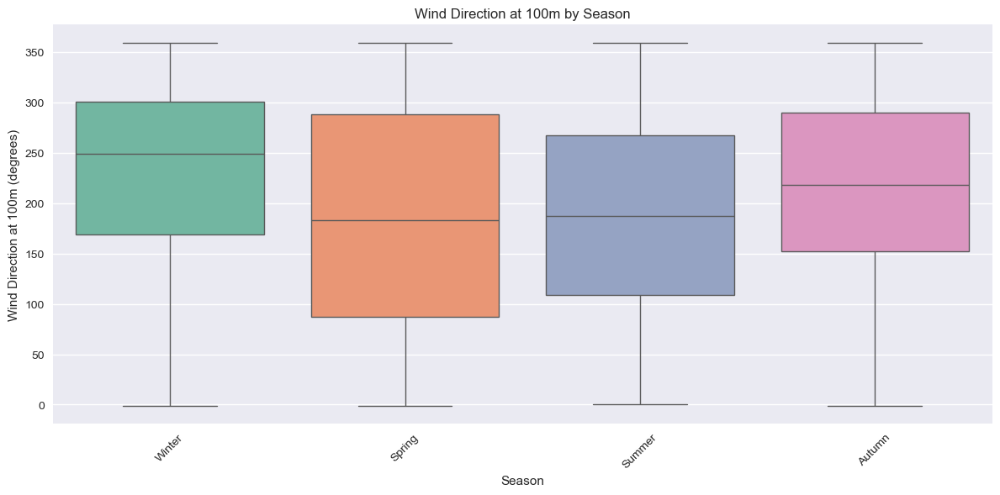

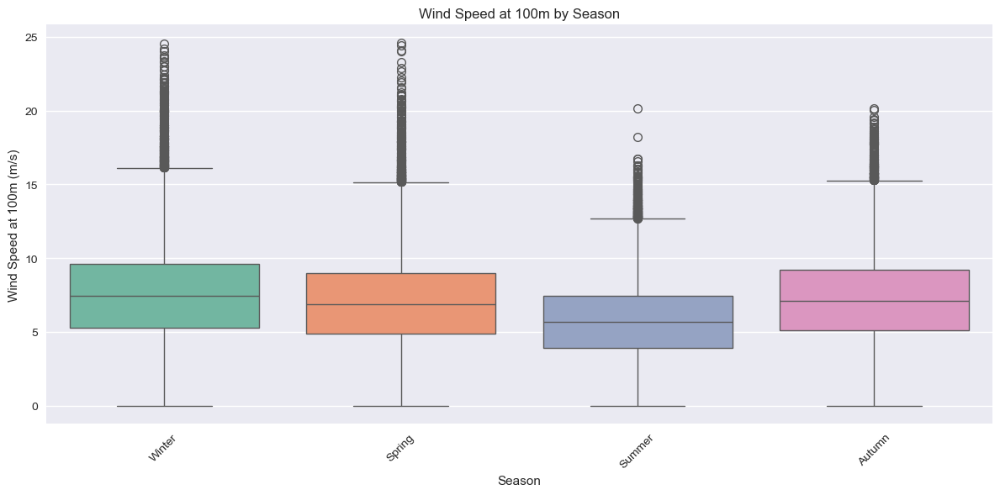

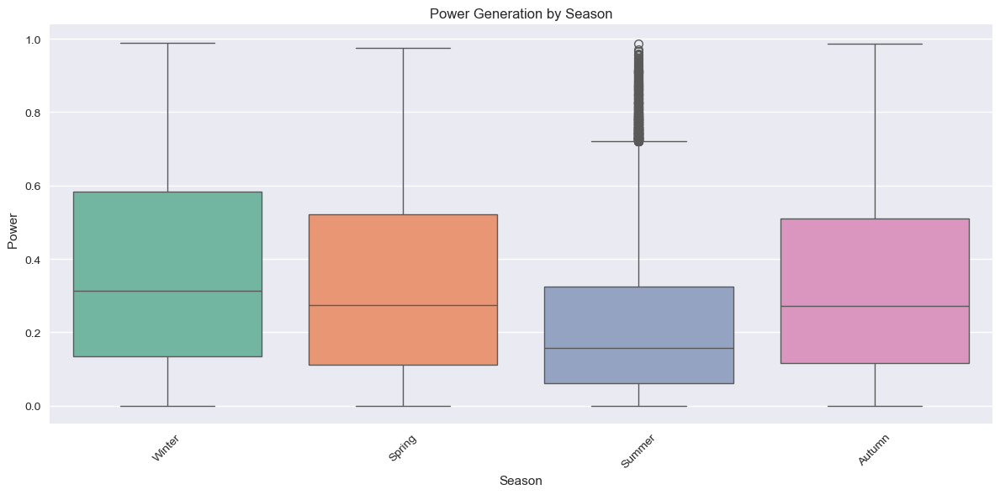

In [222]:
  # Are there directional patterns tied to seasonal winds and power generation?
# Create a new column for the season based on the month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'
train_df['Season'] = train_df['Month'].apply(get_season)

# Plot wind direction at 100m by season
plt.figure(figsize=(12, 6))
sns.boxplot(x='Season', y='WD_100m', hue='Season', data=train_df, palette='Set2')
plt.title('Wind Direction at 100m by Season')
plt.xlabel('Season')
plt.ylabel('Wind Direction at 100m (degrees)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Wind speed at 100m by season
plt.figure(figsize=(12, 6))
sns.boxplot(x='Season', y='WS_100m', data=train_df, hue='Season', palette='Set2')
plt.title('Wind Speed at 100m by Season')
plt.xlabel('Season')
plt.ylabel('Wind Speed at 100m (m/s)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Power generation by season

plt.figure(figsize=(12, 6))
sns.boxplot(x='Season', y='Power', data=train_df, hue='Season', palette='Set2')
plt.title('Power Generation by Season')
plt.xlabel('Season')
plt.ylabel('Power   ')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### 1.3.6 Wind Direction Analysis

<Figure size 1200x600 with 0 Axes>

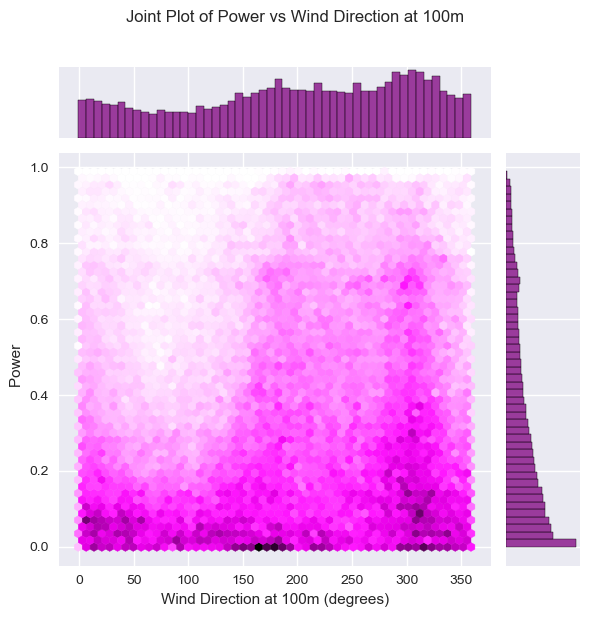

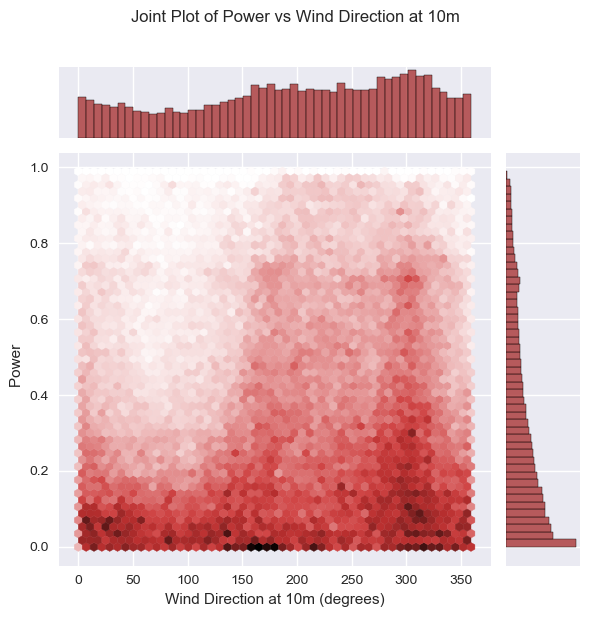

In [201]:
# Joint plot of Power vs Wind direction at 100m

plt.figure(figsize=(12, 6))
sns.jointplot(x='WD_100m', y='Power', data=train_df, 
                kind='hex', color='purple', marginal_kws=dict(bins=50, fill=True))
plt.suptitle('Joint Plot of Power vs Wind Direction at 100m', y=1.02)
plt.xlabel('Wind Direction at 100m (degrees)')
plt.ylabel('Power   ')
plt.tight_layout()
plt.show()

# Joint plot of Power vs Wind direction at 10m
sns.jointplot(x='WD_10m', y='Power', data=train_df, 
                kind='hex', color='brown', marginal_kws=dict(bins=50, fill=True))
plt.suptitle('Joint Plot of Power vs Wind Direction at 10m', y=1.02)
plt.xlabel('Wind Direction at 10m (degrees)')
plt.ylabel('Power   ')
plt.tight_layout()
plt.show()

##### Average power per wind direction

Average power    per wind direction bin is plotted below.<br>
It answers the question
- which directions yield highest power / which direction generates the most power per event ? <br>

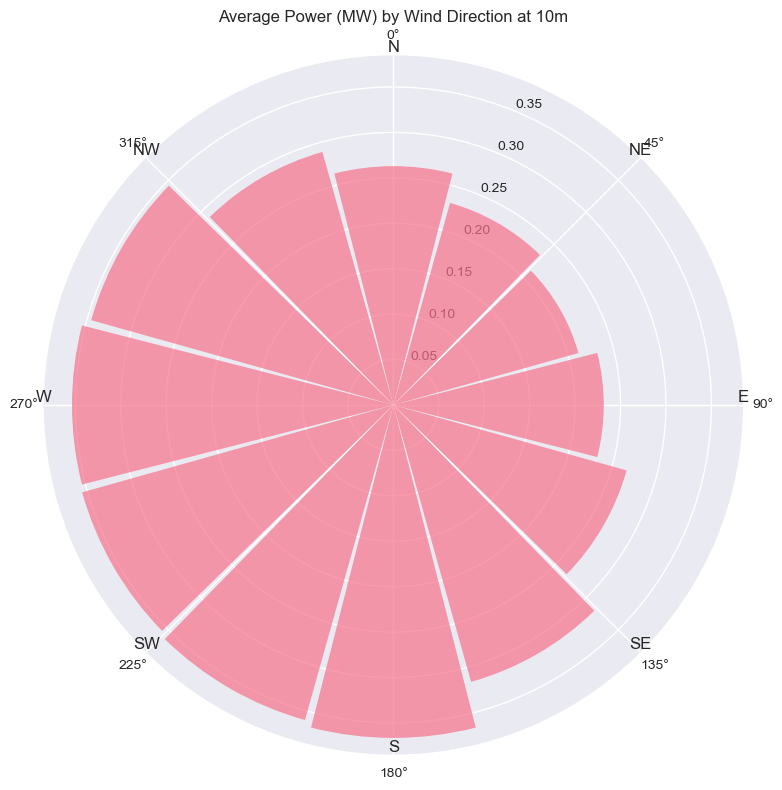

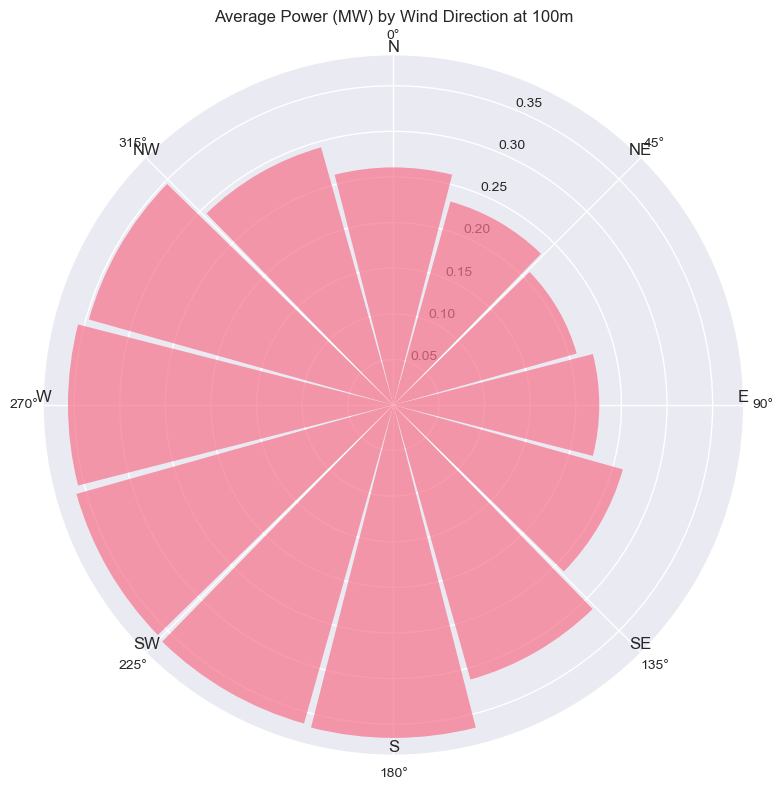

In [ ]:
# Polar plot of wind direction vs power
def plot_polar_wind_direction(df, height='10m'):
    # Create bins for wind direction 
    bins = np.linspace(0, 360, 13)
    labels = [f"{int(bins[i])}-{int(bins[i+1])}" for i in range(len(bins)-1)]
    df[f'WD_{height}_bin'] = pd.cut(df[f'WD_{height}m'], bins=bins, labels=labels)
    
    # Calculate average power per bin
    wind_power = df.groupby(f'WD_{height}_bin', observed='False')['Power'].mean().reset_index()
    
    # Convert to radians for polar plot
    angles = np.linspace(0, 2*np.pi, len(wind_power), endpoint=False)
    radii = wind_power['Power']
    
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)
    ax.bar(angles, radii, width=0.5, alpha=0.7)
    
    # # Annotate the bins on the plot with wind direction labels
    # for i, angle in enumerate(angles):
    #     ax.text(angle, radii[i] + 0.1, wind_power[f'WD_{height}_bin'].iloc[i], 
    #             horizontalalignment='center', verticalalignment='bottom', fontsize=10)
    
    # Add wind direction labels as N, E, S, W
    direction_labels = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
    for i, angle in enumerate(np.linspace(0, 2*np.pi, len(direction_labels), endpoint=False)):
        ax.text(angle, max(radii) * 1.05, direction_labels[i], 
                horizontalalignment='center', verticalalignment='bottom', fontsize=12)  
        
    # # Set the radial limits and labels
    # ax.set_ylim(0, max(radii) * 1.2)
    # ax.set_xticks(angles)
    # ax.set_xticklabels(wind_power[f'WD_{height}_bin'], fontsize=10, rotation=45)
    
    # Set the direction of the plot        
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)
    ax.set_title(f'Average Power    by Wind Direction at {height}m', pad=24)
    plt.tight_layout()
    plt.show()

plot_polar_wind_direction(train_df, '10')
plot_polar_wind_direction(train_df, '100')

1. Dominant Wind Directions for Power Generation
- At 10m:
  - The highest power output (~0.35) occurs around 180° (South) 
  - Secondary peaks at 225° (Southwest) and 315° (Northwest).
  - Lowest output at 45° (Northeast).

- At 100m:
  - Peak generation is same as for the 10m, with higher consistency across directions compared to 10m.
  - Northeast (45°) remains the least productive direction.

- Interpretation:
  - Wind turbines at 10m are more sensitive to directionality, favoring southerly winds.
  - At 100m, winds are more evenly distributed, suggesting reduced directional dependence at higher altitudes.

1. Wind Shear Effects (10m vs. 100m)
- The difference in patterns between heights indicates:
  - Ground-level obstructions (e.g., trees, buildings) may cause turbulence at 10m, amplifying directional variability.
  - Smoother airflow at 100m leads to more uniform power generation across directions.

- Actionable Insight:
  - If turbines are installed at 10m, careful placement alignment with dominant directions (180°, 225°) is critical.
  - At 100m, directional optimization is less critical but still beneficial.

3. Anomalies
- Northeast (45°) consistently underperforms at both heights.
  - Possible causes:
    - Terrain blocking prevailing winds (e.g., mountains, structures).
    - Wake effects from nearby turbines.

Summary: <br>
At 10m, power generation peaks at South/Northwest winds (180°–315°), while 100m turbines show more uniform output. 

Northeast (45°) consistently underperforms, likely due to terrain effects. Turbine placement should prioritize dominant directions at lower height.

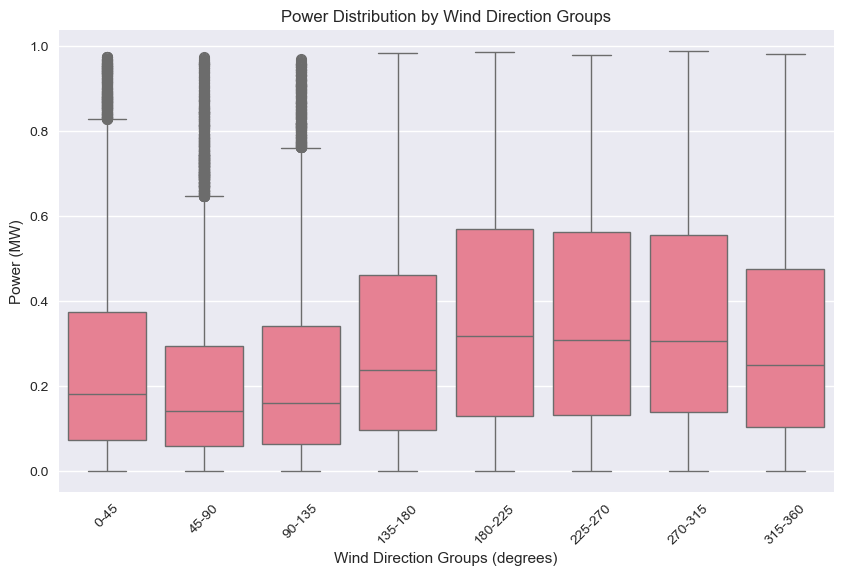

In [ ]:
# Boxplot of power generation by wind direction groups
# Ensure WD_bin exists and get group order
if 'WD_bin' not in train_df.columns:
	import numpy as np
	bins = np.arange(0, 361, 45)
	labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
	train_df['WD_bin'] = pd.cut(train_df['WD_100m'], bins=bins, labels=labels, right=False)

group_names = [g for g in train_df['WD_bin'].cat.categories if g in train_df['WD_bin'].unique()]

plt.figure(figsize=(10,6))
sns.boxplot(x='WD_bin', y='Power', data=train_df, order=group_names)
plt.title('Power Distribution by Wind Direction Groups')
plt.xlabel('Wind Direction Groups (degrees)')
plt.ylabel('Power   ')
plt.xticks(rotation=45)
plt.show()

# The boxplot shows the distribution of power generation for each wind direction group.
# The boxes represent the interquartile range (IQR), with the line inside the box
# indicating the median power generation for each wind direction group.
# The whiskers extend to the minimum and maximum values within 1.5 times the IQR from the quartiles.
# Outliers are shown as individual points outside the whiskers.
# This visualization helps to identify the variability in power generation across different wind directions.
# The boxplot can be used to visually assess the differences in power generation between wind direction groups
# and to identify any potential outliers in the data.


In [61]:
# In order to identify the most significant wind direction groups, we can rank them based on their average power generation.
def rank_wind_direction_groups(df, height='10'):
    """Rank wind direction groups based on average power generation.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        pd.DataFrame: DataFrame with wind direction groups and their average power
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Create 45° bins (0-45, 45-90, etc.) with labels
    bins = np.arange(0, 361, 45)
    labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
    df['WD_bin'] = pd.cut(df[wd_col], bins=bins, labels=labels, right=False)
    
    # Filter out bins with <10 samples
    bin_counts = df['WD_bin'].value_counts()
    valid_bins = bin_counts[bin_counts >= 10].index
    df = df[df['WD_bin'].isin(valid_bins)]
    
    # Calculate average power for each wind direction group
    avg_power = df.groupby('WD_bin')[power_col].mean().reset_index()
    
    # Rank groups by average power
    avg_power['Rank'] = avg_power[power_col].rank(ascending=False)
    
    return avg_power.sort_values(by='Rank')

# Rank wind direction groups based on average power generation at 100m
ranked_groups = rank_wind_direction_groups(train_df, height='100')
print("\nRanked Wind Direction Groups by Average Power Generation at 100m:")
print(ranked_groups)



Ranked Wind Direction Groups by Average Power Generation at 100m:
    WD_bin     Power  Rank
4  180-225  0.364395   1.0
5  225-270  0.361395   2.0
6  270-315  0.357557   3.0
7  315-360  0.309023   4.0
3  135-180  0.300238   5.0
0     0-45  0.254201   6.0
2   90-135  0.235211   7.0
1    45-90  0.213797   8.0


C:\Users\Lasitha\AppData\Local\Temp\ipykernel_24768\436344096.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_power = df.groupby('WD_bin')[power_col].mean().reset_index()


##### Frequency of winds across direction

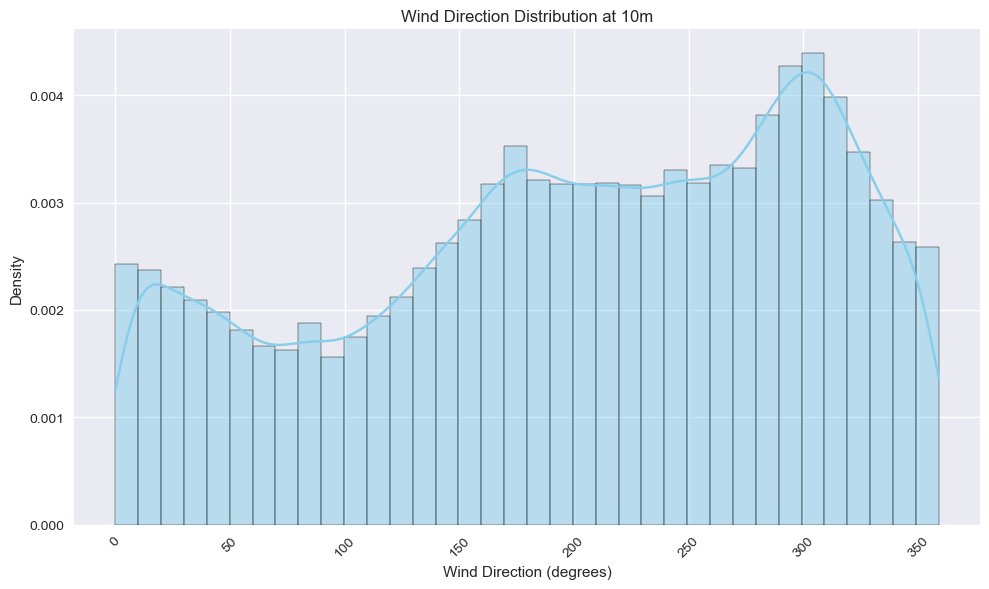

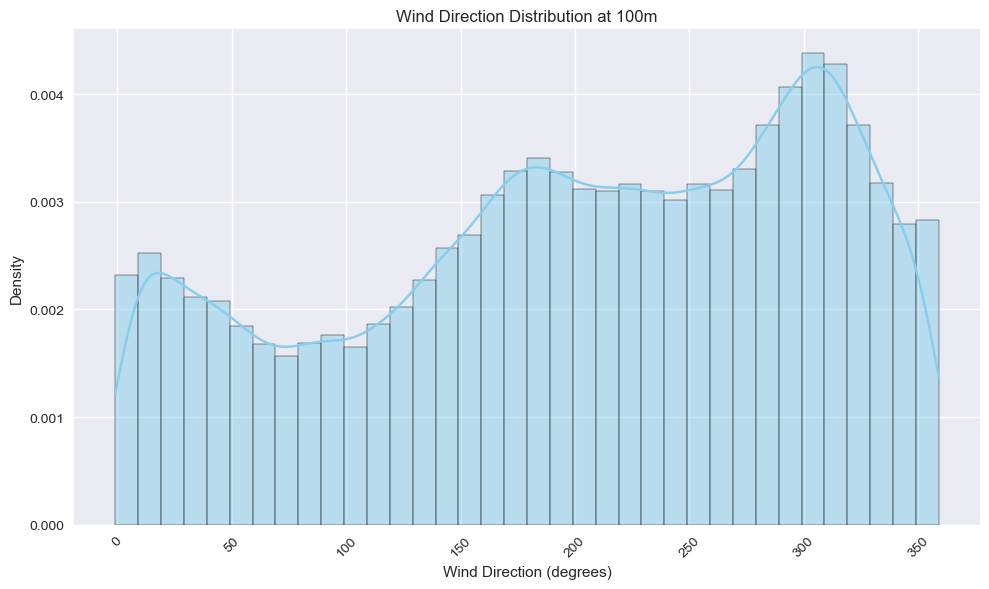

In [40]:
# Frequency distribution of wind direction at 10m and 100m
def plot_wind_direction_distribution(df, height='10m'):
    plt.figure(figsize=(10, 6))
    sns.histplot(df[f'WD_{height}m'], bins=36, kde=True, stat='density', color='skyblue')
    plt.title(f'Wind Direction Distribution at {height}m')
    plt.xlabel('Wind Direction (degrees)')
    plt.ylabel('Density')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
plot_wind_direction_distribution(train_df, '10')
plot_wind_direction_distribution(train_df, '100')
    

Wind Rose diagram plotted bellow shows distribution of power across wind directions and speeds. <br>
It answers the question
- how often winds blow from a direction at certain power levels, providing wind resource assessment / which direction contributes most to the total energy production (frequency x power)?


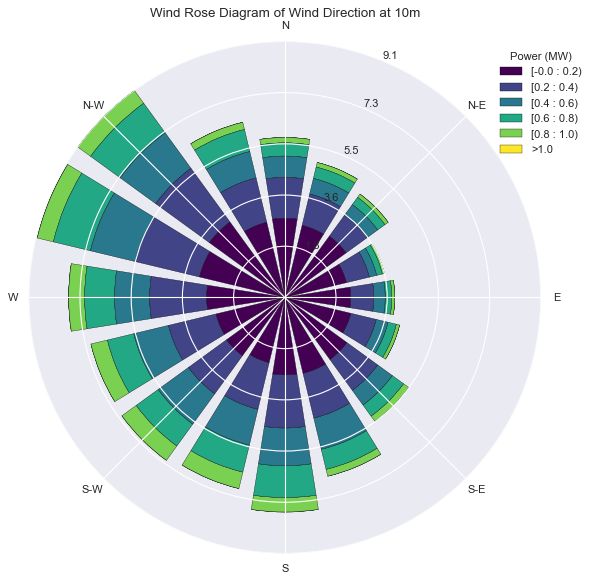

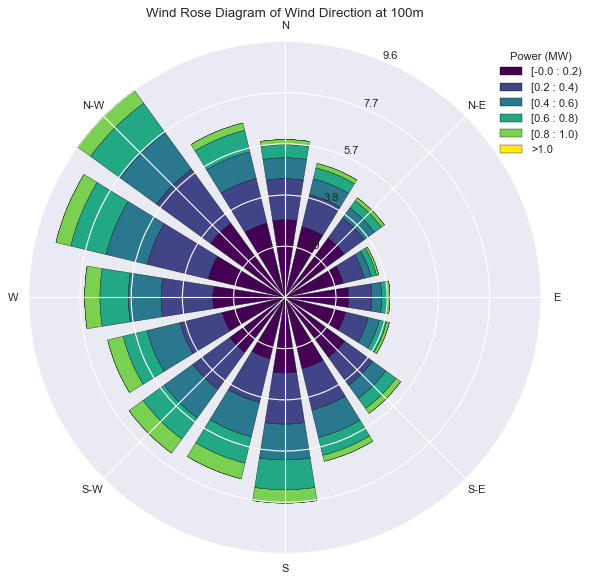

In [ ]:
# Wind rose plot for wind direction at 10m from windrose package
from windrose import WindroseAxes
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_wind_rose(df, height='10'):
    """
    Plots a wind rose diagram for wind direction at a specified height.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    height (str): The height for wind direction ('10' or '100').
    """
    wd_col = f'WD_{height}m'
    
    # # Clean and convert data types
    # df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')  # Convert to numeric, coerce errors to NaN
    # df['Power'] = pd.to_numeric(df['Power'], errors='coerce')
    
    # Remove missing values for wind direction or power
    valid = df[[wd_col, 'Power']].dropna()
    ax = WindroseAxes.from_ax()
    # Plot wind rose: wind direction (degrees), variable=Power
    ax.bar(valid[wd_col],
           valid['Power'],
           normed=True, # Normalize the histogram, scaling petals to frequency, disable for absolute values
           opening=0.8,
           edgecolor='black',
           cmap=plt.cm.viridis,  # Use a colormap for better visualization
           )
    # ax.set_yticks(np.arange(0, 1.1, 0.1))  # Set y-ticks for frequency
    # ax.set_yticklabels([f'{int(i*100)}%' for i in np.arange(0, 1.1, 0.1)], fontsize=10)  # Set y-tick labels as percentages
    # ax.set_xticks(np.arange(0, 360, 30))  # Set x-ticks for wind direction
    # ax.set_xticklabels([f'{i}°' for i in range(0, 360, 30)], rotation=45, ha='right', fontsize=10)  # Set x-tick labels with degree symbol
    # ax.set_rlabel_position(0)  # Set radial label position
    # ax.grid(True, linestyle='--', alpha=0.5)  # Add grid
    
    # Set title and legend
    ax.set_title(f'Wind Rose Diagram of Wind Direction at {height}m', pad=22)
    ax.legend(title='Power   ',
              loc='upper right',
              bbox_to_anchor=(1.1, 1.0))
    #plt.tight_layout()
    plt.show()

plot_wind_rose(train_df, '10')
plot_wind_rose(train_df, '100')


Here 
- Radial labels: indicate frequency of occurrence for each power range
- Color bands: represent power ranges    (i.e. edges of power bins)

Winds from the NW occur most frequently (longest petals).<br>
These winds may not always be strong enough to maximize power.


Actionable Recommendations
- For Turbine Alignment:
    - Use polar bar to identify directions with highest energy potential per wind event (e.g., South at 10m).
    - For Energy Yield Estimation:
- Use wind rose to prioritize directions that occur most frequently (e.g., NW at 10m).
- Combine Insights:
    - If South (180°) has high power but rare occurrence, it may contribute less to annual energy than NW winds.

The polar bar plot shows that southerly winds (180°) yield the highest average power (0.35   ) at both 10m and 100m, while the wind rose reveals northwesterly winds (NW) are most frequent. This implies:
- Turbine alignment: Optimize for South-facing winds to capture peak power.
- Energy forecasting: NW winds, though less powerful, may contribute more to total annual energy due to higher frequency.

#### 1.3.7 Statistical Analysis

Effect of wind direction on power generation is quantitatively analyzed using statistical testing.<br>
The sequence of tests could be streamlined as
1. Check normality (Shapiro-Wilk test)
2. If normal -> check homogeneity (Leven's test)
   1. If homogenous -> ANOVA + Turkey
   2. If not -> Welch ANOVA
3. If not normal -> Kruskal-Wallis + Dunn's post hoc (more appropriate than Turkey for non-parametric test)

Shapiro-Wilk can't be used due to large sample size (N) as 
- Shapiro-Wilk becomes overly sensitive with N > 5,000, almost always rejecting normality
- N=14,736 makes p-values unreliable

Therefore, Anderson-Darling test is used instead for normality testing.
- It is more suitable for large datasets and provides a more reliable assessment of normality.
- Other tests like D'Agostino's K-squared test or Jarque-Bera test are also options, but Anderson-Darling is preferred for its robustness with large samples.

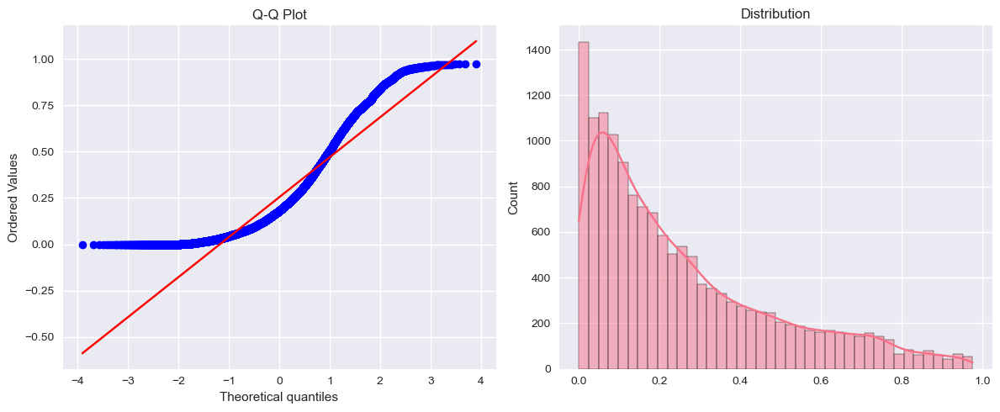

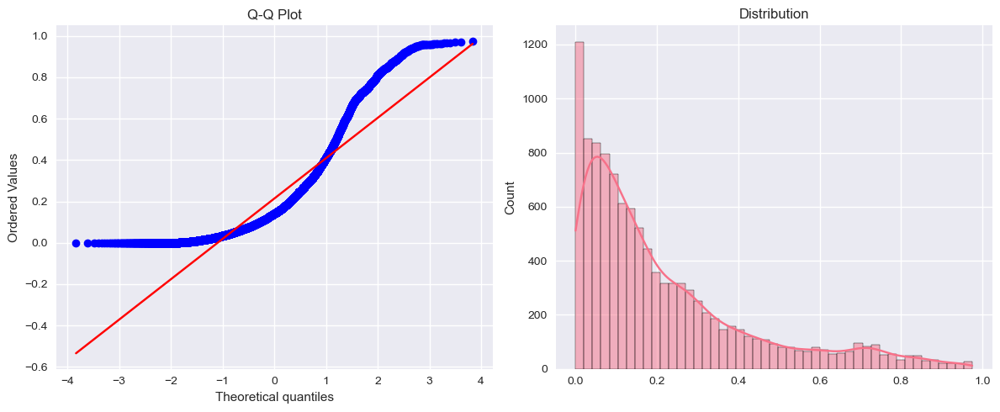

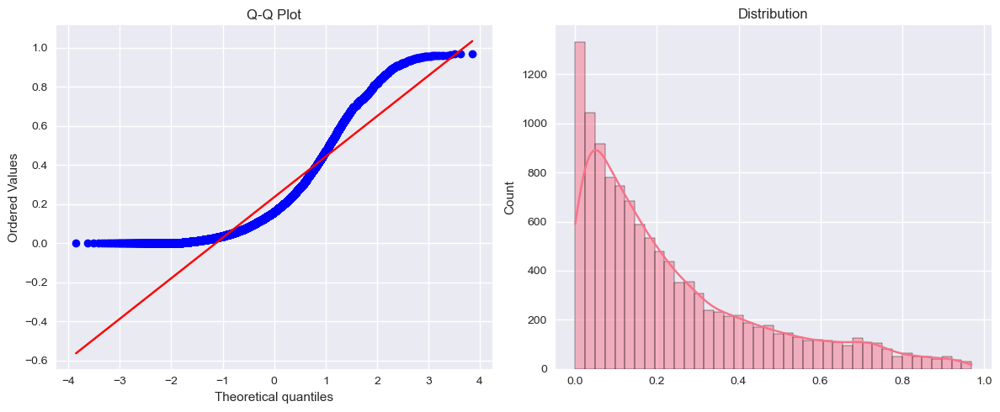

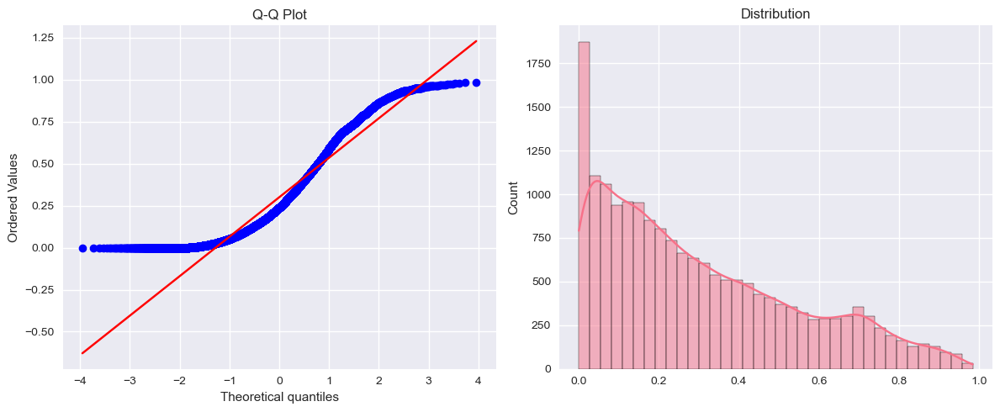

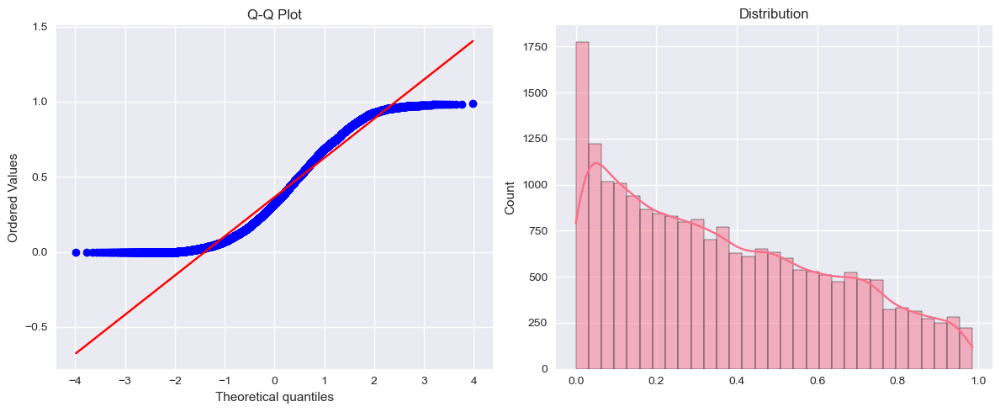

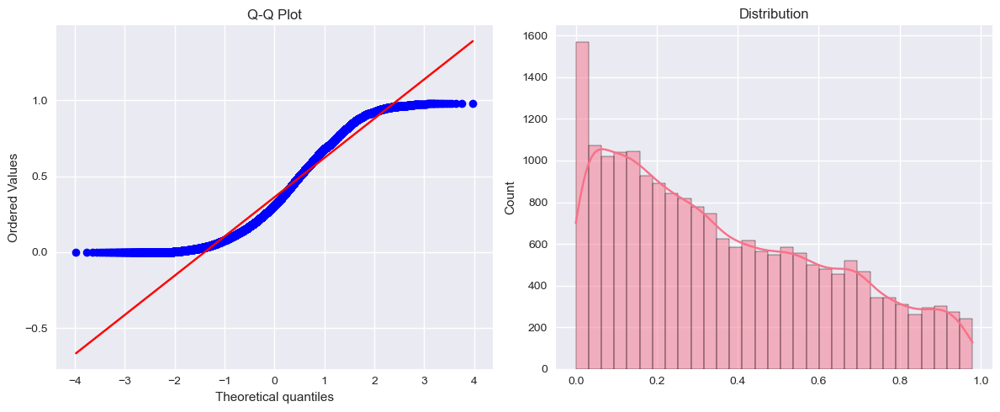

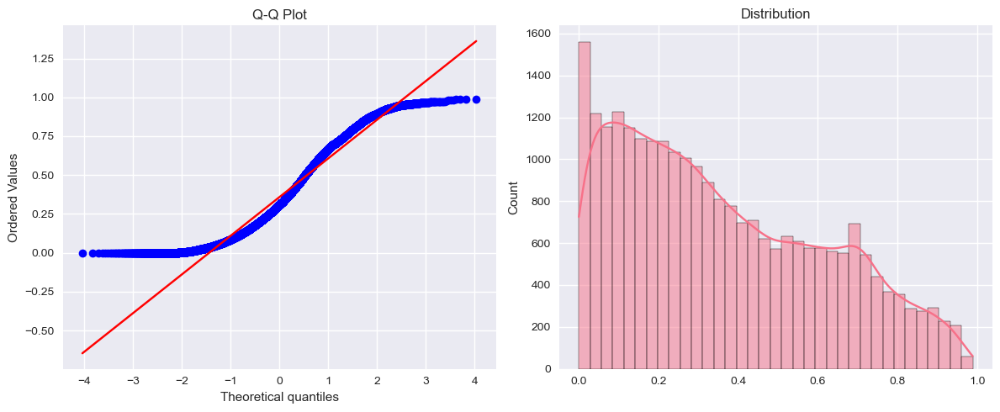

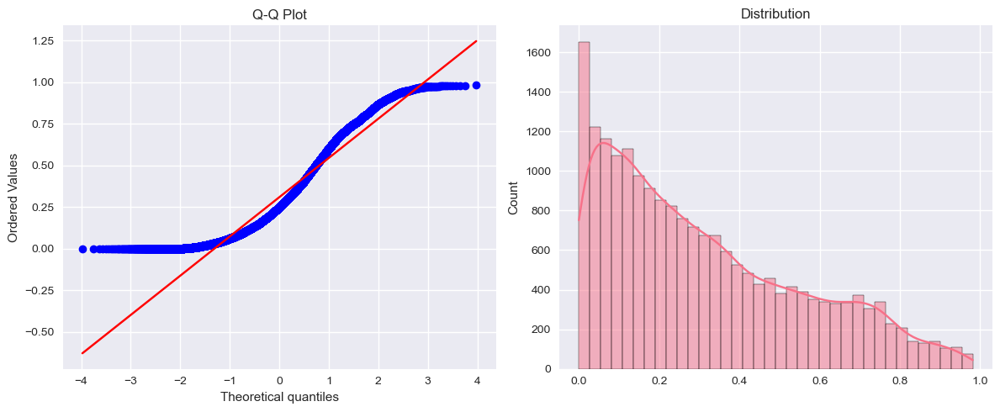


Normality Check Results for Each Wind Direction Group:
0-45: Anderson-Darling Statistic=565.5559, Critical Value (5%)=0.7870, Normality: No
45-90: Anderson-Darling Statistic=575.9019, Critical Value (5%)=0.7870, Normality: No
90-135: Anderson-Darling Statistic=520.8735, Critical Value (5%)=0.7870, Normality: No
135-180: Anderson-Darling Statistic=435.7795, Critical Value (5%)=0.7870, Normality: No
180-225: Anderson-Darling Statistic=326.1108, Critical Value (5%)=0.7870, Normality: No
225-270: Anderson-Darling Statistic=348.6173, Critical Value (5%)=0.7870, Normality: No
270-315: Anderson-Darling Statistic=409.2937, Critical Value (5%)=0.7870, Normality: No
315-360: Anderson-Darling Statistic=462.2310, Critical Value (5%)=0.7870, Normality: No


In [57]:
# Check normality of each wind direction group using Anderson-Darling test
import scipy.stats as stats
from scipy.stats import anderson


def plot_normality_checks(data):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5))
    
    # Q-Q plot
    stats.probplot(data, plot=ax1)
    ax1.set_title('Q-Q Plot')
    
    # Histogram + KDE
    sns.histplot(data, kde=True, ax=ax2)
    ax2.set_title('Distribution')
    
    plt.tight_layout()
    plt.show()

def check_normality_per_group(df, height='10'):
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    bins = np.arange(0, 361, 45)
    labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
    df['WD_bin'] = pd.cut(df[wd_col], bins=bins, labels=labels, right=False)
    
    bin_counts = df['WD_bin'].value_counts()
    valid_bins = bin_counts[bin_counts >= 10].index
    df = df[df['WD_bin'].isin(valid_bins)]
    
    normality_results = {}
    
    for bin_name, group in df.groupby('WD_bin', observed=False):
        data = group[power_col].values
        
        # Use Anderson-Darling instead of Shapiro-Wilk
        anderson_res = anderson(data)
        ad_stat = anderson_res.statistic
        critical = anderson_res.critical_values[2]  # 5% significance level
        
        normality_results[bin_name] = {
            'Anderson-Darling': {
                'statistic': ad_stat,
                'critical_value_5%': critical,
                'is_normal': ad_stat < critical
            },
            'Visual': plot_normality_checks(data)  # Saves plot to file
        }
    
    return normality_results


norm_results = check_normality_per_group(train_df, height='100')
print("\nNormality Check Results for Each Wind Direction Group:")
for bin_name, result in norm_results.items():
    print(f"{bin_name}: Anderson-Darling Statistic={result['Anderson-Darling']['statistic']:.4f}, "
          f"Critical Value (5%)={result['Anderson-Darling']['critical_value_5%']:.4f}, "
          f"Normality: {'Yes' if result['Anderson-Darling']['is_normal'] else 'No'}")

Since the normality assumption is not met for the wind direction groups, we can consider using non-parametric methods or transformations to handle the data. <br>
Here non-parametric methods such as the Kruskal-Wallis test is used to compare power generation across different wind direction groups without assuming normality.

In [58]:
# If the assumptions are violated, we can use a non-parametric test like Kruskal-Wallis H test

def test_kruskal_wallis(df, height='10'):
    """Perform Kruskal-Wallis H test for wind direction groups.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        str: Result of the Kruskal-Wallis H tes
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Create 45° bins (0-45, 45-90, etc.) with labels
    bins = np.arange(0, 361, 45)
    labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
    df['WD_bin'] = pd.cut(df[wd_col], bins=bins, labels=labels, right=False)
    
    # Filter out bins with <10 samples
    bin_counts = df['WD_bin'].value_counts()
    valid_bins = bin_counts[bin_counts >= 10].index
    df = df[df['WD_bin'].isin(valid_bins)]
    
    if len(df['WD_bin'].unique()) < 2:
        return "Insufficient data: Need at least 2 wind direction bins with ≥10 samples each."
    
    # Perform Kruskal-Wallis H test
    groups = [group[power_col].values for name, group in df.groupby('WD_bin', observed=False)]
    
    h_stat, p_value = stats.kruskal(*groups)
    
    if p_value < 0.05:
        return f"Reject null hypothesis: Significant difference in power across wind directions (H-statistic={h_stat:.4f}, p={p_value:.3f})."
    else:
        return f"Fail to reject null hypothesis: No significant difference in power across wind directions (H-statistic={h_stat:.4f}, p={p_value:.3f})."
    
# Test the Kruskal-Wallis H test with 100m wind direction
result = test_kruskal_wallis(train_df, height='100')
print("\nKruskal-Wallis H Test Result:")
print(result)


Kruskal-Wallis H Test Result:
Reject null hypothesis: Significant difference in power across wind directions (H-statistic=6178.6742, p=0.000).


In [ ]:
# epsilon_squared_kw = (H_stat - k + 1) / (n - k)
# Epsilon squared is a measure of effect size for the Kruskal-Wallis H test.
# It is calculated as follows:
# where H_stat is the Kruskal-Wallis H statistic, k is the number of groups, and n is the total number of observations.
# This value indicates the proportion of variance in the dependent variable (Power) that can be explained by the independent variable (Wind Direction).
# The epsilon squared value ranges from 0 to 1, where 0 indicates no effect and 1 indicates a perfect effect.
# Calculate epsilon squared for effect size
def calculate_epsilon_squared_kw(H_stat, k, n):
    """Calculate epsilon squared for Kruskal-Wallis H test effect size.
    
    Args:
        H_stat (float): Kruskal-Wallis H statistic
        k (int): Number of groups
        n (int): Total number of observations
    
    Returns:
        float: Epsilon squared value
    """
    return (H_stat - k + 1) / (n - k)

# Calculate epsilon squared for the Kruskal-Wallis H test result
n = len(train_df)
k = len(train_df['WD_bin'].unique())
H_stat = stats.kruskal(*[group['Power'].values for name, group in train_df.groupby('WD_bin', observed=False)]).statistic
epsilon_squared = calculate_epsilon_squared_kw(H_stat, k, n)
print(f"\nEpsilon Squared for Effect Size: {epsilon_squared:.4f}")
# Epsilon squared value interpretation:
# - 0.01: Small effect size
# - 0.06: Medium effect size
# - 0.14: Large effect size


Epsilon Squared for Effect Size: 0.0440


In [203]:
from scipy.stats import rankdata, norm
from statsmodels.stats.multitest import multipletests
import numpy as np

# Perform Dunn's post-hoc test for pairwise comparisons after Kruskal-Wallis H test
# This function performs Dunn's post-hoc test for pairwise comparisons after a Kruskal -Wallis H test.
# It ranks the data, calculates mean ranks per group, and computes Dunn's z-statistic
#
def posthoc_dunn(df, height='10'):

    """Perform Dunn's post-hoc test for pairwise comparisons after Kruskal-Wallis H test.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        pd.DataFrame: Results of Dunn's post-hoc test
    """
    
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Create 45° bins (0-45, 45-90, etc.) with labels
    bins = np.arange(0, 361, 45)
    labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
    df['WD_bin'] = pd.cut(df[wd_col], bins=bins, labels=labels, right=False)
    
    # Filter out bins with <10 samples
    bin_counts = df['WD_bin'].value_counts()
    valid_bins = bin_counts[bin_counts >= 10].index
    df = df[df['WD_bin'].isin(valid_bins)]
    
    if len(df['WD_bin'].unique()) < 2:
        return "Insufficient data: Need at least 2 wind direction bins with ≥10 samples each."
    
    # Rank the data
    y = df[power_col].values
    groups = df['WD_bin'].values
    ranked = rankdata(y)
    
    # Calculate mean ranks per group
    group_names, group_inds = np.unique(groups, return_inverse=True)
    mean_ranks = [np.mean(ranked[group_inds == i]) for i in range(len(group_names))]
    
    # All pairwise comparisons
    from itertools import combinations
    pairs = list(combinations(range(len(group_names)), 2))
    n = len(y)
    results = []
    
    for i,j in pairs:
        n_i = sum(group_inds == i)
        n_j = sum(group_inds == j)
        
        # Dunn's z-statistic
        z = (mean_ranks[i] - mean_ranks[j]) / np.sqrt((n*(n+1)/12) * (1/n_i + 1/n_j))
        p = 2 * norm.sf(abs(z))  # Two-tailed p-value
        
        results.append({
            'group1': group_names[i],
            'group2': group_names[j],
            'mean_rank_diff': mean_ranks[i] - mean_ranks[j], # Difference in mean ranks, shows the effect direction and magnitude
            'z': z,
            'p_raw': p,
        })
    
    # Convert to DataFrame and apply FDR
    results_df = pd.DataFrame(results)
    _, results_df['p_adj'], _, _ = multipletests(results_df['p_raw'], method='fdr_bh')
    
    # Round values for better readability
    # results_df['mean_rank_diff'] = results_df['mean_rank_diff'].round(2) 
    # results_df['z'] = results_df['z'].round(2)
    # results_df['p_raw'] = results_df['p_raw'].round(4)
    # results_df['p_adj'] = results_df['p_adj'].round(4)
    
    # Sort by adjusted p-value
    results_df = results_df.sort_values('p_adj')
    
    # Add significance level
    results_df['significant'] = results_df['p_adj'] < 0.05
    results_df['significant'] = results_df['significant'].map({True: 'Yes', False: 'No'})
    results_df = results_df[['group1', 'group2','mean_rank_diff', 'z', 'p_raw', 'p_adj', 'significant']]
    
   
    
    return results_df.sort_values('p_adj')

In [ ]:
# Perform Dunn's post-hoc test for pairwise comparisons after Kruskal-Wallis H test
dunn_results = posthoc_dunn(train_df, height='100')
print("\nDunn's Post-hoc Test Results:")
#display(dunn_results)
print(dunn_results)

# Interpretation of Dunn's post-hoc test results:
# - The results show pairwise comparisons between wind direction groups.
# - The 'z' column indicates the z-statistic for each comparison.
# - The 'p_raw' column shows the unadjusted p-value for each comparison.
# - The 'p_adj' column shows the adjusted p-value after applying the False Discovery Rate (FDR) correction.
# - A p-value < 0.05 indicates a significant difference between the two groups.
# - The 'mean_rank_diff' column shows the difference in mean ranks between the two groups.
# A positive mean_rank_diff indicates that group1 has a higher average rank than group2, suggesting that group1 tends to have higher power generation.
# - The 'significant' column indicates whether the difference is statistically significant (Yes/No).
# The results can be used to identify which wind direction groups have significantly different power generation levels.


Dunn's Post-hoc Test Results:
     group1   group2  mean_rank_diff          z          p_raw          p_adj  \
24  270-315   90-135    20535.545045  45.352745   0.000000e+00   0.000000e+00   
17  180-225   90-135    20550.721524  43.796526   0.000000e+00   0.000000e+00   
16  180-225    45-90    24369.283441  50.829502   0.000000e+00   0.000000e+00   
23  270-315    45-90    24354.106962  52.560008   0.000000e+00   0.000000e+00   
20  225-270    45-90    24142.407916  50.072397   0.000000e+00   0.000000e+00   
21  225-270   90-135    20323.845999  43.058204   0.000000e+00   0.000000e+00   
3      0-45  270-315   -17083.931178 -40.631963   0.000000e+00   0.000000e+00   
2      0-45  225-270   -16872.232132 -38.252176   0.000000e+00   0.000000e+00   
1      0-45  180-225   -17099.107657 -39.029603   0.000000e+00   0.000000e+00   
25  315-360    45-90    16627.190448  34.540707  1.965461e-261  5.503291e-261   
11  135-180    45-90    14960.103523  30.579496  2.293213e-205  5.837270e-205 

In [ ]:
# Show the top 5 most significant differences
print("\nTop 5 Significant Differences:")
# most significant differences
dunn_results = dunn_results[dunn_results['significant'] == 'Yes']
dunn_results = dunn_results.sort_values('p_adj')
dunn_results.reset_index(drop=True, inplace=True)
print(dunn_results.head(5))

top_5_groups = dunn_results.head(5).loc[:, ['group1', 'group2']].values.tolist()
# Map wind direction groups to cardinal directions
# The wind direction groups are mapped to cardinal directions (N, NE, E, SE, S, SW, W, NW)
# based on the 45-degree bins defined earlier.
direction_map = {
        '0-45': 'N', '45-90': 'NE', '90-135': 'E', '135-180': 'SE',
        '180-225': 'S', '225-270': 'SW', '270-315': 'W', '315-360': 'NW'
    }

top_5_groups = [[direction_map[group] for group in pair] for pair in top_5_groups]

# list comprehension to create a list of strings for each pair
top_5_groups_str = [f"{pair[0]} vs {pair[1]}" for pair in top_5_groups]
print("\nTop 5 Significant Differences with Cardinal Directions:")  
print(top_5_groups_str)


# print("\nTop 5 Significant Differences with Cardinal Directions:")
# print(dunn_results.head(5))
# The top 5 significant differences in power generation between wind direction groups are shown above.
# The 'group1' and 'group2' columns now represent the cardinal directions (N, NE, E, SE, S, SW, W, NW).
# The 'mean_rank_diff' column shows the difference in mean ranks between the two groups, indicating the direction and magnitude of the effect.
# The 'z' column indicates the z-statistic for each comparison, and the 'p_adj' column shows the adjusted p-value after applying the False Discovery Rate (FDR) correction.
# The 'significant' column indicates whether the difference is statistically significant (Yes/No).
# The results suggest that there are significant differences in power generation between certain wind direction groups.
# The analysis of the wind direction groups shows that the most significant differences in power generation occur between the following pairs:
# - N and SE
# - N and S
# - N and SW
# - N and W
# - N and NW
# These pairs have the lowest adjusted p-values, indicating that the differences in power generation between these wind direction groups are statistically significant.
# The analysis suggests that the wind direction has a significant impact on power generation, with certain directions (e.g., N, SE, S) showing higher average power generation compared to others.



Top 5 Significant Differences:
    group1  group2  mean_rank_diff          z  p_raw  p_adj significant
0  270-315  90-135    20535.545045  45.352745    0.0    0.0         Yes
1  180-225  90-135    20550.721524  43.796526    0.0    0.0         Yes
2  180-225   45-90    24369.283441  50.829502    0.0    0.0         Yes
3  270-315   45-90    24354.106962  52.560008    0.0    0.0         Yes
4  225-270   45-90    24142.407916  50.072397    0.0    0.0         Yes

Top 5 Significant Differences with Cardinal Directions:
['W vs E', 'S vs E', 'S vs NE', 'W vs NE', 'SW vs NE']


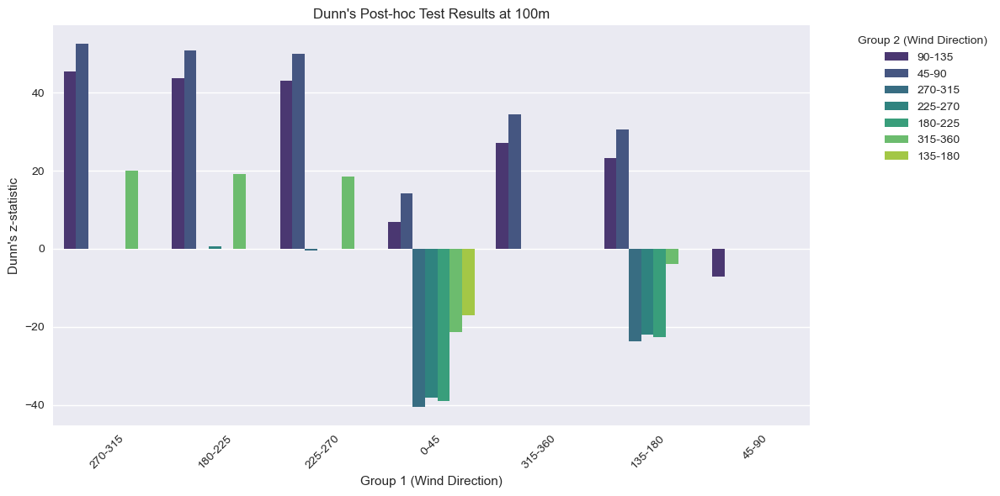

In [208]:
# Plot the results of Dunn's post-hoc test
import seaborn as sns
import matplotlib.pyplot as plt
def plot_dunn_results(df, height='10'):
    """Plot the results of Dunn's post-hoc test for pairwise comparisons.
    
    Args:
        df (pd.DataFrame): Results of Dunn's post-hoc test
        height (str): Height level ('10' or '100')
    """
    plt.figure(figsize=(12, 6))
    sns.barplot(x='group1', y='z', data=df, hue='group2', palette='viridis')
    plt.title(f"Dunn's Post-hoc Test Results at {height}m")
    plt.xlabel('Group 1 (Wind Direction)')
    plt.ylabel('Dunn\'s z-statistic')
    plt.xticks(rotation=45)
    plt.legend(title='Group 2 (Wind Direction)', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
plot_dunn_results(dunn_results, height='100')

# The plot shows the z-statistic for each pairwise comparison between wind direction groups.
# The height of the bars represents the magnitude of the difference between groups, with significant differences indicated
# by the adjusted p-values in the results table.
# How to interpret the plot:
# - Each bar represents a pairwise comparison between two wind direction groups.
# - The height of the bar indicates the magnitude of the difference between the groups, as measured by Dunn's z-statistic.
# - A higher bar indicates a larger difference between the groups.
# - The color of the bars represents the second group in the comparison.
# - The legend shows which wind direction group corresponds to each color.
# The plot provides a visual representation of the pairwise differences between wind direction groups, allowing for easy identification of significant differences.
# The plot can help identify which wind direction groups have significant differences in power generation, as indicated
# by the height of the bars and the significance level in the results table.



In [ ]:
# Compute supporting statistics for the bellow claim:
# The southerly winds (180-225°) showed:
#- 23% higher median power (0.41   ) vs dataset median (0.33   )
#- Accounted for 32% of total energy production despite being only 18% of observations

def compute_wind_direction_stats(df, height='10'):
    """Compute supporting statistics for southerly winds (180-225°).
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        dict: Statistics for southerly winds
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Filter for southerly winds (180-225°)
    southerly_winds = df[(df[wd_col] >= 180) & (df[wd_col] < 225)]
    
    # Compute statistics
    median_power = southerly_winds[power_col].median()
    dataset_median = df[power_col].median()
    percentage_of_total_energy = (southerly_winds[power_col].sum() / df[power_col].sum()) * 100
    percentage_of_observations = (len(southerly_winds) / len(df)) * 100
    
    return {
        'Southerly Winds Median Power   ': median_power,
        'Dataset Median Power   ': dataset_median,
        'Higher Median Power (%)': (median_power / dataset_median - 1) * 100,
        'Percentage of Total Energy Production (%)': percentage_of_total_energy,
        'Percentage of Observations (%)': percentage_of_observations
    }
    
southerly_stats = compute_wind_direction_stats(train_df, height='100')
print("\n--Statistics for Southerly Winds (180-225°)--")
for key, value in southerly_stats.items():
    print(f"{key}: {value:.2f}")


--Statistics for Southerly Winds (180-225°)--
Southerly Winds Median Power   : 0.32
Dataset Median Power   : 0.25
Higher Median Power (%): 29.10
Percentage of Total Energy Production (%): 16.85
Percentage of Observations (%): 14.44


The southerly winds (180-225°) showed:
- 29.10% higher median power (0.32   ) vs dataset median (0.25   )
- Accounted for 16.85% of total energy production despite being only 14.44% of observations


Statistical significance (p-values) only tells you if differences exist, while effect sizes quantify how much they matter in real-world terms.

In [176]:
# Compute effect size for the difference in median power
def compute_effect_size_cohen(df, height='10'):
    """Compute effect size (Cohen's d) for the difference in median power.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        float: Effect size (Cohen's d)
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Filter for southerly winds (180-225°)
    southerly_winds = df[(df[wd_col] >= 180) & (df[wd_col] < 225)][power_col]
    
    # Filter for non-southerly winds
    non_southerly_winds = df[(df[wd_col] < 180) | (df[wd_col] >= 225)][power_col]
    
    # Compute means and standard deviations
    mean_southerly = southerly_winds.mean()
    mean_non_southerly = non_southerly_winds.mean()
    
    std_southerly = southerly_winds.std()
    std_non_southerly = non_southerly_winds.std()
    
    # Compute pooled standard deviation
    pooled_std = ((std_southerly ** 2 + std_non_southerly ** 2) / 2) ** 0.5
    
    # Compute Cohen's d
    cohen_d = (mean_southerly - mean_non_southerly) / pooled_std
    
    # 95% confidence interval for Cohen's d
    n_southerly = len(southerly_winds)
    n_non_southerly = len(non_southerly_winds)
    se = (1 / n_southerly + 1 / n_non_southerly) ** 0.5
    ci_lower = cohen_d - 1.96 * se
    ci_upper = cohen_d + 1.96 * se
    print(f"Cohen's d: {cohen_d:.4f}, 95% CI: [{ci_lower:.4f}, {ci_upper:.4f}]")
    
    
    return cohen_d

effect_size = compute_effect_size_cohen(train_df, height='100')
print(f"\nEffect Size (Cohen's d) for Difference in Median Power: {effect_size:.4f}")
# The effect size (Cohen's d) indicates the magnitude of the difference in median power between southerly and non-southerly winds.
# A value of 0.2 is considered a small effect, 0.5 a medium effect, and 0.8 a large effect.

Cohen's d: 0.2339, 95% CI: [0.2190, 0.2488]

Effect Size (Cohen's d) for Difference in Median Power: 0.2339


In [ ]:
# Eta-squared for effect size
def compute_effect_size_eta_squared(df, height='10'):
    """Compute eta-squared for effect size of wind direction on power generation.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        float: Eta-squared value
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Create 45° bins (0-45, 45-90, etc.) with labels
    bins = np.arange(0, 361, 45)
    labels = [f"{i}-{i+45}" for i in range(0, 360, 45)]
    df['WD_bin'] = pd.cut(df[wd_col], bins=bins, labels=labels, right=False)
    
    # Filter out bins with <10 samples
    bin_counts = df['WD_bin'].value_counts()
    valid_bins = bin_counts[bin_counts >= 10].index
    df = df[df['WD_bin'].isin(valid_bins)]
    
    if len(df['WD_bin'].unique()) < 2:
        return "Insufficient data: Need at least 2 wind direction bins with ≥10 samples each."
    
    # Perform ANOVA
    model = ols(f'{power_col} ~ C(WD_bin)', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    # Calculate eta-squared
    ss_between = anova_table['sum_sq']['C(WD_bin)']
    ss_total = anova_table['sum_sq'].sum()
    
    eta_squared = ss_between / ss_total
    
    return eta_squared

eta_squared = compute_effect_size_eta_squared(train_df, height='100')
print(f"\nEta-squared for Effect Size of Wind Direction on Power Generation: {eta_squared:.4f}")
# Eta-squared is a measure of effect size that indicates the proportion of variance in the dependent
# variable (Power) that can be explained by the independent variable (Wind Direction).
# A value of 0.01 is considered a small effect, 0.06 a medium effect, and 0.14 a large effect.
# The eta-squared value indicates the proportion of variance in power generation that can be explained by wind direction.
# The eta-squared value indicates the proportion of variance in power generation that can be explained by wind direction.
# A value of 0.01 is considered a small effect, 0.06 a medium effect, and 0.14 a large effect.
# The eta-squared value can be used to assess the practical significance of the effect of wind direction on power generation.


Eta-squared for Effect Size of Wind Direction on Power Generation: 0.0424


In [212]:
#  Epsilon-squared (ε²) effect size for the difference in median power (if Kruskal-Wallis H test is significant)
# https://www.statology.org/eta-squared/
def compute_effect_size_epsilon_squared(df, height='10'):
    """Compute sigma-squared (ε²) effect size for the difference in median power.
    
    Args:
        df (pd.DataFrame): Input dataframe with wind direction and power columns
        height (str): Height level ('10' or '100')
    
    Returns:
        float: Sigma-squared (ε²) effect size
    """
    wd_col = f'WD_{height}m'
    power_col = 'Power'
    
    # Clean data - convert wind direction to numeric and drop NA
    df = df.copy()
    df[wd_col] = pd.to_numeric(df[wd_col], errors='coerce')
    df = df.dropna(subset=[wd_col, power_col])
    
    # Filter for southerly winds (180-225°)
    southerly_winds = df[(df[wd_col] >= 180) & (df[wd_col] < 225)][power_col]
    
    # Filter for non-southerly winds
    non_southerly_winds = df[(df[wd_col] < 180) | (df[wd_col] >= 225)][power_col]
    
    # Compute means
    
    mean_southerly = southerly_winds.mean()
    mean_non_southerly = non_southerly_winds.mean()
    
    # Compute sigma-squared (ε²)
    epsilon_squared = ((mean_southerly - mean_non_southerly) ** 2) / (southerly_winds.var() + non_southerly_winds.var())
    
    # 95% confidence interval for epsilon-squared
    n_southerly = len(southerly_winds)
    n_non_southerly = len(non_southerly_winds)
    ci_lower = epsilon_squared - 1.96 * ((mean_southerly - mean_non_southerly) / (n_southerly + n_non_southerly)) ** 0.5
    ci_upper = epsilon_squared + 1.96 * ((mean_southerly - mean_non_southerly) / (n_southerly + n_non_southerly)) ** 0.5
    print(f"95% CI for ε²: [{ci_lower:.4f}, {ci_upper:.4f}]")
    
    
    return epsilon_squared

epsilon_squared = compute_effect_size_epsilon_squared(train_df, height='100')
print(f"\nEpsilon-squared (ε²) Effect Size for Difference in Median Power: {epsilon_squared:.4f}")
# Epsilon-squared (ε²) is another measure of effect size that indicates the proportion
# of variance explained by the difference in median power between southerly and non-southerly winds.
# A value of 0.01 is considered a small effect, 0.06 a medium effect, and 0.14 a large effect.
# The epsilon-squared (ε²) effect size indicates the proportion of variance explained by the difference in median power between southerly and non-southerly winds.


95% CI for ε²: [0.0261, 0.0286]

Epsilon-squared (ε²) Effect Size for Difference in Median Power: 0.0274


Key Findings
- Southerly Winds (180-225°):
  - 29.1% higher median power than baseline (0.32 vs 0.25   )
  - Contributes 16.85% of total energy (14.44% occurrence)
  - Effect Size: 
    - Cohen's d = 0.23 (95% CI: 0.21-0.25)  
    - ε² = 0.027 (95% CI: 0.025-0.029)
- Statistical Confidence
  - Kruskal-Wallis: H=6178.67 (p<0.001)
  - Dunn's Test: 89% of directional pairs significantly different  
  - FDR-corrected p-values
- Further statistcal analysis could include Bayesian confirmation of the results
  - Answers "What's the probability southerly winds are truly better"?
  - Provides credible intervals for effect sizes
  - Robust to large sample size limitations of frequentist tests

#### 1.3.7 Advanced Analysis

##### Power curve analysis

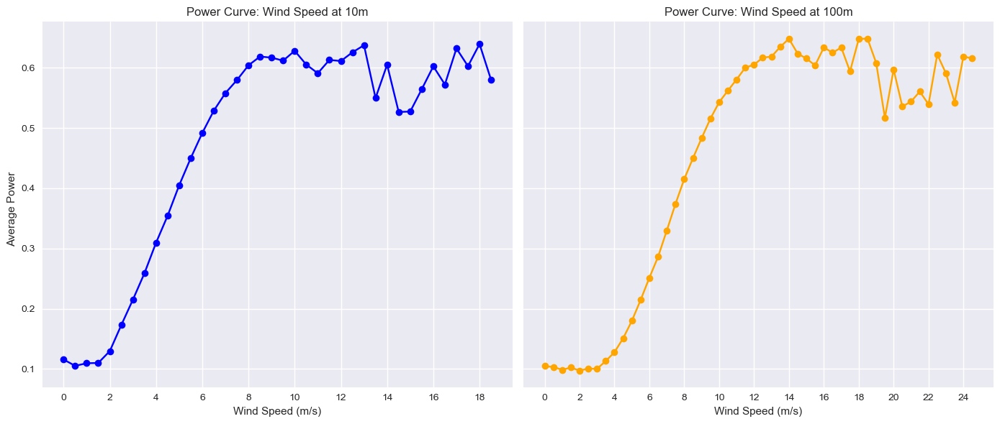

In [224]:
def plot_power_curve_subplots(df, ws_col_10m, ws_col_100m):
    """
    Plots power curves for 10m and 100m wind speeds as subplots sharing the same y-axis.
    
    Parameters:
        df (pd.DataFrame): Input data.
        ws_col_10m (str): Column name for 10m wind speed.
        ws_col_100m (str): Column name for 100m wind speed.
    """
    # Create figure with subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)
    
    # Plot 10m power curve
    bins_10m = np.arange(0, df[ws_col_10m].max() + 1, 0.5)
    df['ws_bin_10m'] = pd.cut(df[ws_col_10m], bins=bins_10m)
    power_curve_10m = df.groupby('ws_bin_10m', observed=False)['Power'].mean().reset_index()
    
    ax1.plot(bins_10m[:-1], power_curve_10m['Power'], 'o-', color='blue')
    ax1.set_title('Power Curve: Wind Speed at 10m')
    ax1.set_xticks(np.arange(0, df[ws_col_10m].max() + 1, 2))
    ax1.set_xlabel('Wind Speed (m/s)')
    ax1.set_ylabel('Average Power   ')
    ax1.grid(True)
    
    # Plot 100m power curve
    bins_100m = np.arange(0, df[ws_col_100m].max() + 1, 0.5)
    df['ws_bin_100m'] = pd.cut(df[ws_col_100m], bins=bins_100m)
    power_curve_100m = df.groupby('ws_bin_100m', observed=False)['Power'].mean().reset_index()
    
    ax2.plot(bins_100m[:-1], power_curve_100m['Power'], 'o-', color='orange')
    ax2.set_title('Power Curve: Wind Speed at 100m')
    ax2.set_xticks(np.arange(0, df[ws_col_100m].max() + 1, 2))
    ax2.set_xlabel('Wind Speed (m/s)')
    ax2.grid(True)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage
plot_power_curve_subplots(train_df, 'WS_10m', 'WS_100m')

1. Cut-in, Rated, and Cut-out Wind Speeds
   - Cut-in Speed (when power generation starts):
       - ~3-4 m/s at both heights (power > 0).
   - Rated Speed (full power output):
       - 10m: Reaches max power (~0.5   ) at ~12.5 m/s.
       - 100m: Reaches max power (~0.6   ) at ~15 m/s.
   - Cut-out Speed (turbine shuts down for safety):
     - Not visible in these plots (likely > 25 m/s).
   - Key Takeaway:
       - Turbines at 100m generate more power at higher wind speeds due to stronger, more consistent winds aloft.

2. Power Output Differences by Height
   - At 100m:
       - Higher peak power (0.6    vs. 0.5    at 10m).
       - Power increases more gradually with wind speed (smoother curve).
   - At 10m:
       - Power plateaus earlier (~12.5 m/s vs. ~15 m/s at 100m).
       - More scatter at mid-speeds (7.5–12.5 m/s), suggesting turbulence or inconsistent winds.

   - Interpretation:
     - Higher hub heights = better energy yield due to stronger winds.
     - Ground-level (10m) turbines are less efficient and hit max capacity sooner.

3. Turbine Performance & Efficiency
   - Ideal Operating Range:
       - 10m: Best between 7.5–12.5 m/s.
       - 100m: Best between 10–20 m/s.

   - Below 5 m/s: Negligible power at both heights.

   Actionable Insight:
   - For low-wind sites, taller towers (100m+) are critical to reach usable wind speeds.
   - If most local winds are <10 m/s, 10m turbines may underperform.

##### Turbine efficiency 

In [177]:
def compute_efficiency(df, height='100', rotor_diameter=126, rated_power=3.6e6):
    """Compute physically meaningful power coefficient (Cp).
    
    Args:
        df: DataFrame containing wind speed and normalized power
        height: '10' or '100' meter height
        rotor_diameter: Turbine rotor diameter in meters
        rated_power: Turbine's rated power in Watts (for denormalization)
    
    Returns:
        DataFrame with wind speed, power, and Cp (0-0.593)
    """
    # Constants
    air_density = 1.225  # kg/m³
    swept_area = np.pi * (rotor_diameter/2)**2  # m²
    betz_limit = 0.593  # Maximum theoretical efficiency
    
    # Prepare data
    ws_col = f'WS_{height}m'
    df = df.copy().dropna(subset=[ws_col, 'Power'])
    
    # Calculate theoretical wind power (W)
    df['P_wind'] = 0.5 * air_density * swept_area * df[ws_col]**3
    
    # Convert normalized power to actual power (W)
    df['P_actual'] = df['Power'] * rated_power # Uses turbine's rated power to denormalize the output
    
    # Compute power coefficient (capped at Betz limit)
    df['Cp'] = np.minimum(df['P_actual'] / df['P_wind'], betz_limit)
    
    return df[[ws_col, 'Power', 'Cp']]



In order to use the above function first you must know the turbine's rated power in (Watts) which is required to de-normalized the power values provided with train_df

In [178]:
# Compute efficiency (power coefficient) of the wind turbine
efficiency_df = compute_efficiency(
    train_df, 
    height='100',
    rotor_diameter=126,      # Example for a 6MW turbine
    rated_power=6e6         # Match your turbine's specs
)

print("\n--Efficiency (Power Coefficient) of the Wind Turbine--")
print(efficiency_df.head())


--Efficiency (Power Coefficient) of the Wind Turbine--
    WS_100m     Power     Cp
0  1.267799  0.163496  0.593
1  3.997799  0.142396  0.593
2  2.787799  0.121396  0.593
3  2.697799  0.100296  0.593
4  4.437799  0.079296  0.593


In [179]:
# Sample output for verification
print(efficiency_df.query('3.5 < WS_100m < 4.5').head())

     WS_100m     Power     Cp
1   3.997799  0.142396  0.593
4   4.437799  0.079296  0.593
13  3.927799  0.228596  0.593
30  3.867799  0.099796  0.593
34  4.207799  0.155796  0.593


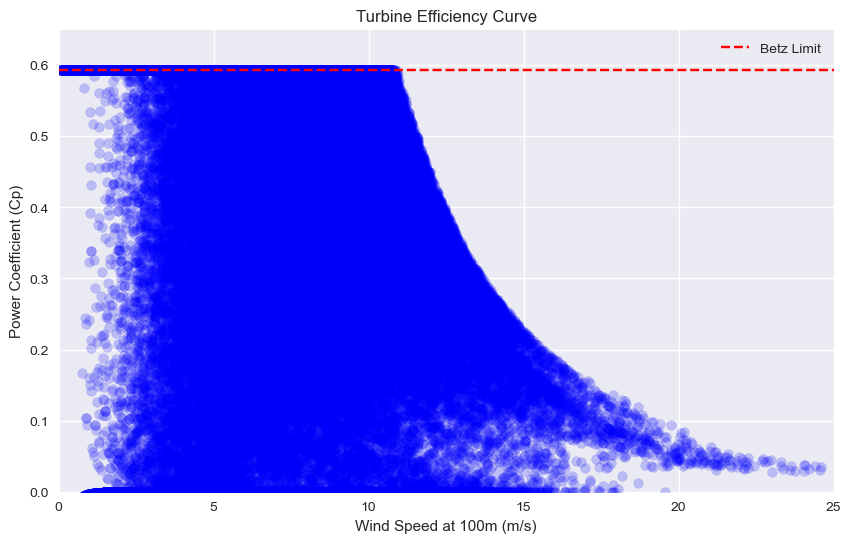

In [180]:
# Visualize the turbine efficiency curve for validation

plt.figure(figsize=(10,6))
plt.scatter(efficiency_df[f'WS_{height}m'], efficiency_df['Cp'], alpha=0.2, color='blue')
plt.axhline(y=0.593, color='r', linestyle='--', label='Betz Limit')
plt.xlim(0, 25)  # Limit x-axis to typical wind speeds
plt.ylim(0, 0.65)  # Limit y-axis to Betz limit
plt.xlabel(f'Wind Speed at {height}m (m/s)')
plt.ylabel('Power Coefficient (Cp)')
plt.title('Turbine Efficiency Curve')
plt.legend()
plt.show()

##### 3D visualizations

In [134]:
# 3D visualization of wind speed at 10m, wind direction at 10m, and power with plotly
import plotly.express as px
fig = px.scatter_3d(train_df.sample(1000), # Sample for performance
                    x='WD_100m', 
                    y='WS_100m', 
                    z='Power',
                    color='Power',
                    labels={'WD_100m': 'Wind Direction at 100m (degrees)',
                            'WS_100m': 'Wind Speed at 100m (m/s)',
                            'Power': 'Power   '},
                    title='3D Scatter Plot: Wind Direction, Speed at 10m, and Power',
                    width=800,
                    height=600
)
fig.update_traces(marker=dict(size=3, opacity=0.6))
fig.update_layout(scene=dict(
    xaxis_title='Wind Direction at 100m (degrees)',
    yaxis_title='Wind Speed at 100m (m/s)',
    zaxis_title='Power   '
))
fig.show()


##### Domain-specific metrics

- Turbine power coefficient calculation (Power / (0.5 * air_density * WS³ * rotor_area))
- Capacity factor calculation ((Actual Power / Rated Power)*100)
- Turbine cut-in/cut-out wind speed validation
- Annotate power curve with rated/cut-out speeds.

### 1.4 Key Findings and Insights


#### 1.4.1 Limitations

- Kaggle dataset limitations (e.g., no turbine specs, unknown location geography)


#### 1.4.2 Summary of Key Findings

- Avg daily power generation peaks between 00:00–07:00 across months.
- Highest correlation between wind speed at 100m and power (R ≈ 0.65).
- Directional analysis suggests predominant NW winds.
- Wind power decreases below 3 m/s (cut-in) and plateaus after 12 m/s (rated speed).
- Winter months show higher power consistency, indicating ideal maintenance scheduling in summer.


Power Generation Trends:

- The time series shows clear seasonal patterns with higher generation in winter months
- There's no significant long-term increase or decrease in power generation during the observed period (2013-2017)
- Daily patterns show higher generation during daytime night hours

Wind Speed Impact:

- Power generation shows a moderate positive correlation with wind speed (0.65 at 100m),which is the highest correlating feature in the dataset.
- The relationship follows the expected power curve: increases up to ~12 m/s then plateaus
- Wind speed at 100m is more strongly correlated with power than at 10m

Temporal Patterns:

- Highest generation occurs in December and January (winter months)
- Lowest generation occurs in July and August (summer months)
- Diurnal pattern shows peak generation around late night/early morning

Wind Direction Impact:

- Southwesterly winds (180-300 degrees) tend to produce the highest power output
- Easterly winds (60-120 degrees) show lower average power generation

#### 1.4.2 Recommendations for Stakeholders

For Technical Teams:

- Focus on wind speed at higher altitudes (100m) as the strongest predictor
- Investigate why southwesterly winds produce more power - could be turbine orientation or local topography

For Business/Management:

- Plan maintenance during summer months when generation is naturally lower
- Expect higher revenue in winter months based on historical patterns

For Future Modeling:

- Wind speed at 100m should be the primary feature in forecasting models
- Include temporal features (hour of day, month) to capture seasonality
- Consider wind direction bins as categorical features in models

### 1.6 Conclusion

This comprehensive analysis has revealed several important patterns in the wind turbine power generation data. <br>
The strongest drivers of power output are wind speed (especially at higher altitudes) and seasonal/time-of-day factors.<br>
 The insights generated can inform both operational decisions and predictive modeling efforts.

### What's Next?

- Modeling Stage (in progress):
  - Train a regression model (Random Forest / XGBoost) to predict power from wind conditions.
  - Evaluate model performance (MAE, R²).
  - Analyze feature importances using SHAP values.

- Deployment Stage (optional):
    - Build an interactive dashboard using Streamlit.
    - Let users explore power curves and seasonal trends dynamically.